# Here is the Main temporal convergence maker.

This notebook contains strong convergence by refining pathwise. 

Let $\Delta W^{h}$ denote a increment sequence at resolution $h = \Delta t$. 
One can add successive increments via: $$\Delta W^{2h}_{n} = \Delta W^{h}_{n+1} + \Delta W^{h}_n$$ to form a new path at a lower spatial resolution $2h = 2\Delta t$, since $$\Delta W^{h}_{n+1} + \Delta W^{h}_n = W^{h}(t_{n+2})-W^{h}(t_{n+1}) + W^{h}(t_{n+1})-W^{h}(t_{n}) = W^{2h}(t_{n+1})-W^{2h}(t_{n})$$.

This way the high resolution path and the low resolution path agree at certain points
$W(t_n) = \sum_{i=1}^{n}\Delta W^h_{i} = \sum_{i=1}^{2n}\Delta W^{2h}_{i}$, $\forall n$. By constructing paths in this way one can test the strong convergence of the numerical scheme. 

In [2]:
import os
os.environ["JAX_ENABLE_X64"] = "true"
import sys
sys.path.append('..')
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from ipywidgets import interact
from ml_collections import ConfigDict
from models.ETD_KT_CM_JAX_Vectorised import *
from filters import resamplers
from filters.filter import ParticleFilter
from jax import config
from jax import vmap

config.update("jax_enable_x64", True)
import scienceplots
plt.style.use(['science','ieee'])

ModuleNotFoundError: No module named 'jax'

Consider the stochastic KdV equation 
\begin{align}
d u + uu_x + u_{xxx} + \xi u_x \circ dW = 0.
\end{align}
Define the stochastic moving frame $X(t,x) = x - \xi W(t)$, $dX = \xi dW$, it is a stochastic process.
Define a new function in the moving frame $v(t,X(t,x)) = u(t,x)$. Such that 
\begin{align}
du = dv(t,X(t,x)) = \partial_t v - \frac{\partial v}{\partial X} \xi dW  = \partial_t v - \frac{\partial u}{\partial x} \xi dW
\end{align}
Transforms the stochastic KdV equation, into a deterministic pde, such that one can derive the analytic solution
$\cosh^2( (x - 4 \beta^2 t_n - \frac{1}{2} W(t_n)) $

It is important to note that the $\cosh^2(x)$ travelling wave assumes vanishing contribution at infinity $u=u_x=u_{xxx}=0$ for $x=\pm \infty$.
We are implementing this $\cosh^2(x)$ travelling wave solution with periodic boundary conditions on $x\in [-\pi,\pi]$.
This is technically incorrect, as the wave solution has finite values of $u,u_x,u_{xx}$, at $[-\pi,\pi]$. Resulting in a periodic discontinuity in the first derivative. However this error can be made small by making the sech squared tall and thin so that exponentially the amplitude of the wave becomes zero. 

### Main script below!

In [ ]:
# generation of the refined increments. 
key1 = jax.random.PRNGKey(0)
key = jax.random.PRNGKey(0)
max_number = 10
nmax = int(1e3 * 2**max_number) 
print(f"min temporal resolution: {int(1e3)}, max temporal resolution: {nmax}")
tmax = 0.1 
dt = 1e-4*(1/2)**max_number 
E=1; P=1
dW = jax.random.normal(key1, shape=(nmax, E, P))
print(dW.shape)
dW_refine = []; W_refine = []; time_refine = []
for l in range(0, max_number+1):
    nmax = int(1e3 * 2**(l)) # the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
print(len(W_refine))
print(len(dW_refine))
for i in range(len(dW_refine)):
    print(dW_refine[i].shape,time_refine[i].shape)
for i in range(len(dW_refine)):
    print(jnp.var(dW_refine[i][:,0,0]/jnp.sqrt(2**(max_number-i))))

NameError: name 'jax' is not defined

: 

Parameters: 
$\Delta t = 1e-4 (1/2^{i}),$ $i\in \lbrace 1,...,10 \rbrace$, 

$t_{max}=0.1$, 
$n_{x}=256$, 
$\xi = 1$, 
$u_0 = 3 \beta \cosh( \frac{\sqrt{\beta}}{2}  x  )^{-2}$ where $\beta = 8^2$.

$u_0 = 3 \beta \operatorname{sech}^{2} ( \frac{\sqrt{\beta}}{2} x )$ 

1000


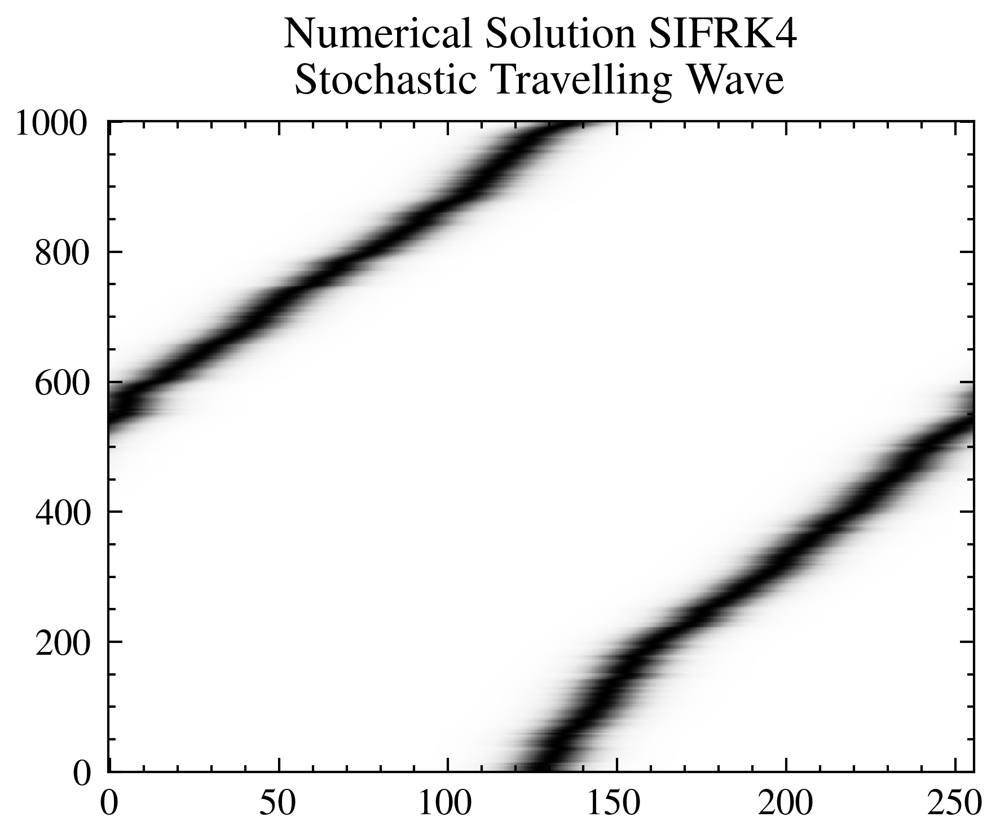

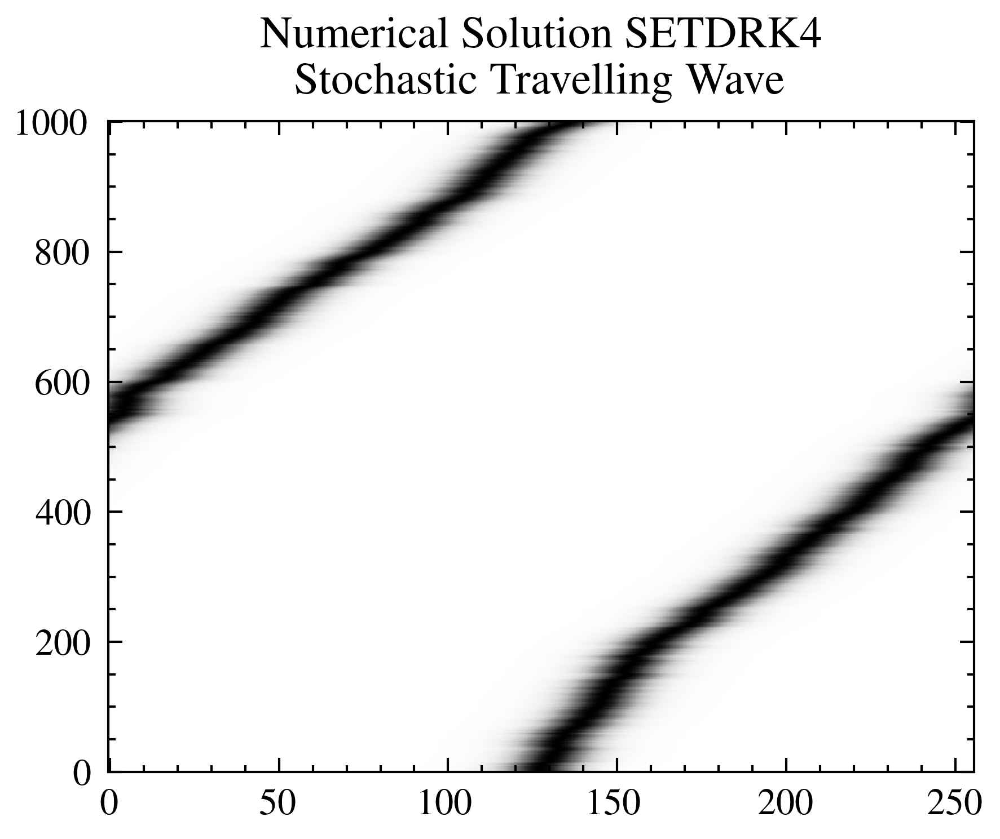

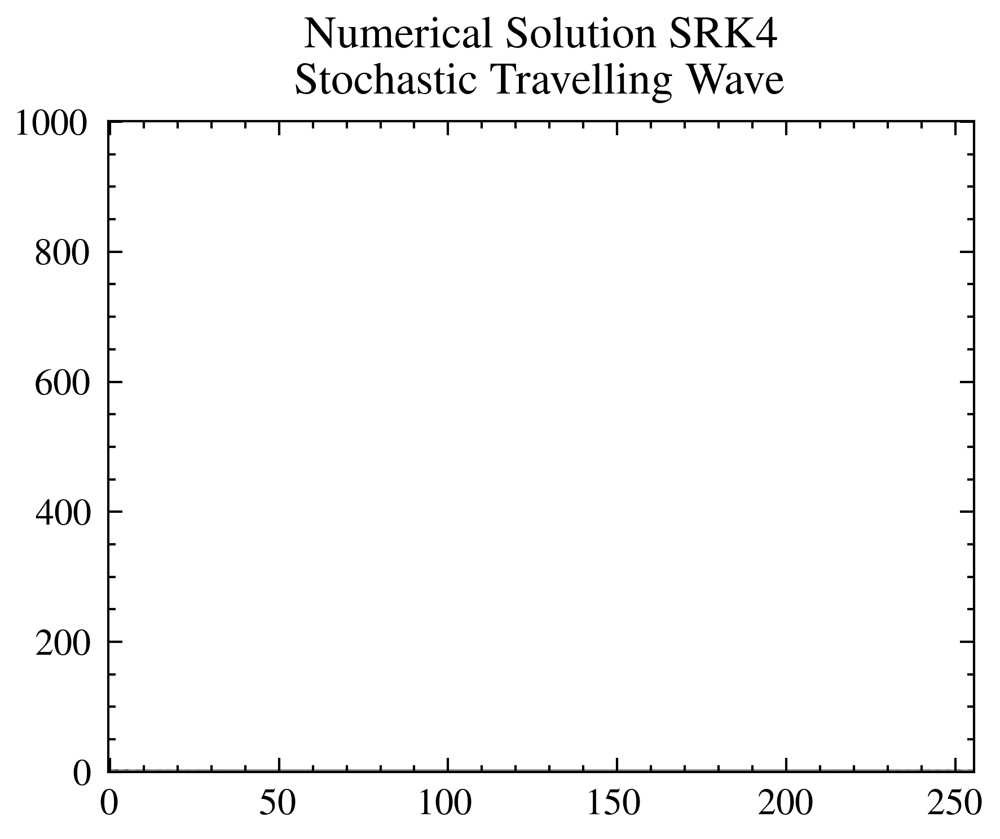

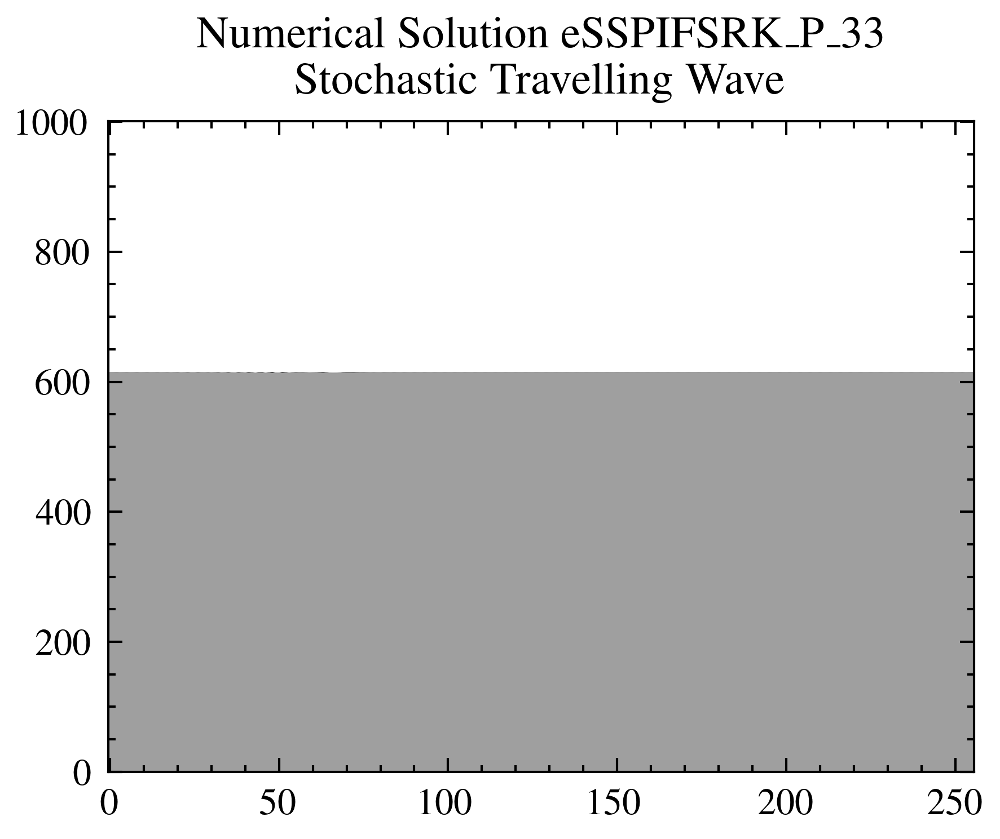

dt: 0.0001 nt 1000 Tmax 0.1
array: [0.00217198 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] [0.00086876 0.         0.         0.         0.         0.
 0.         0.         0.         0.        ] [nan  0.  0.  0.  0.  0.  0.  0.  0.  0.] [nan  0.  0.  0.  0.  0.  0.  0.  0.  0.]


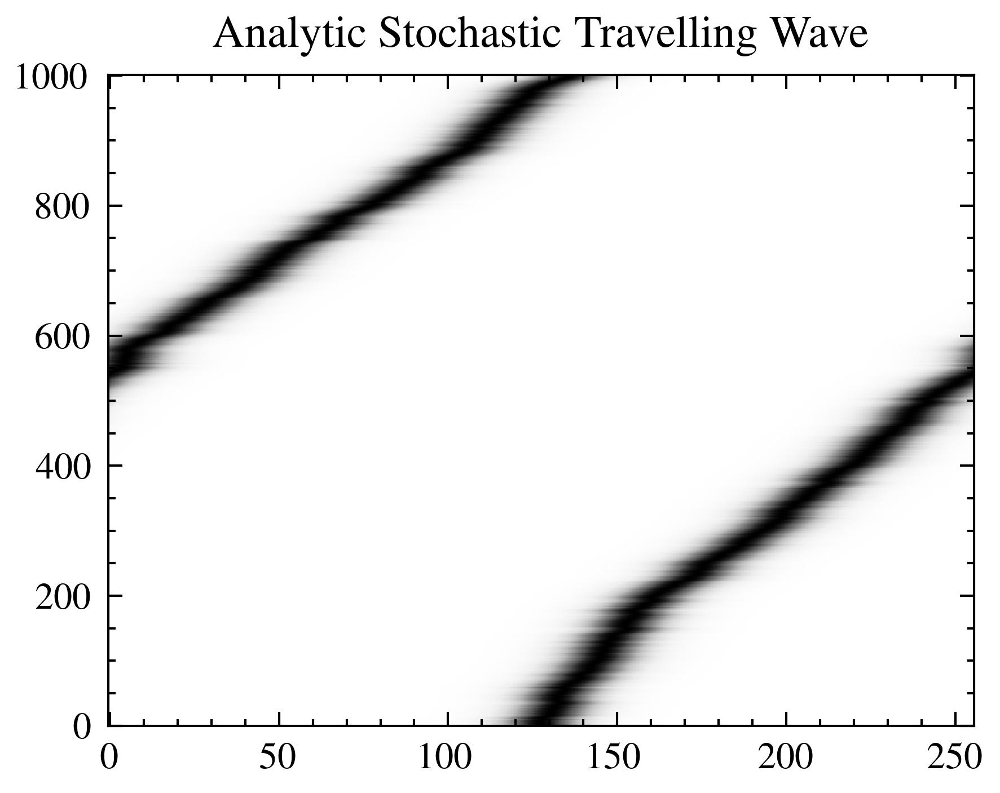

2000


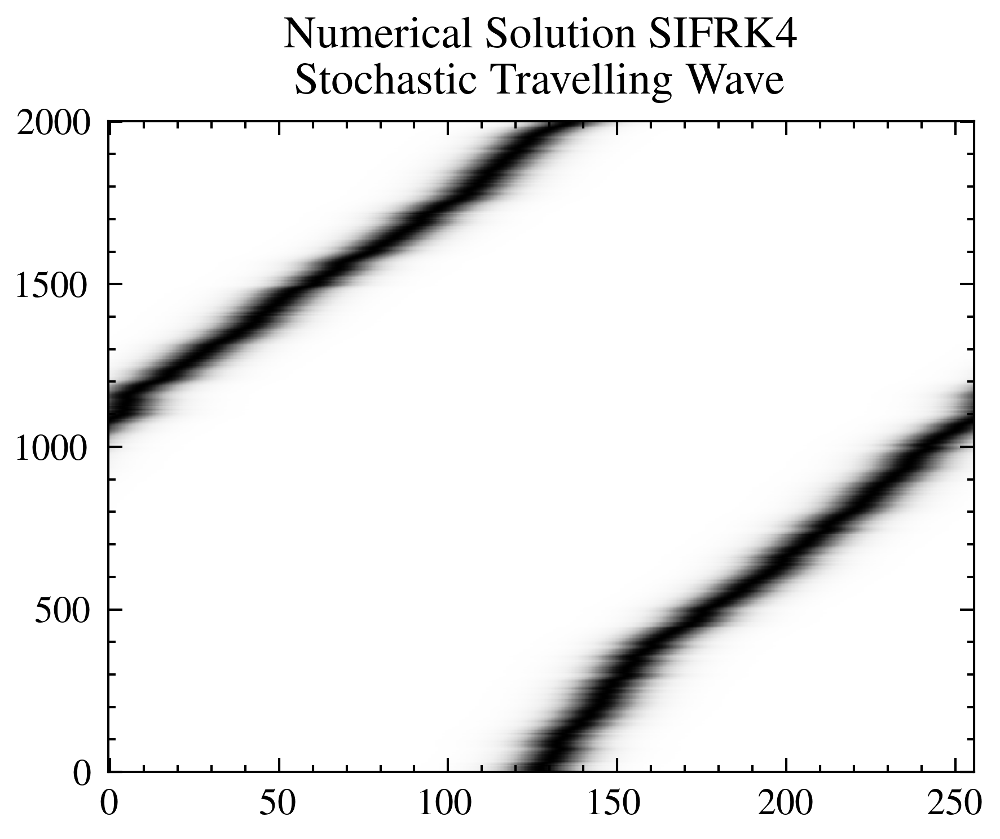

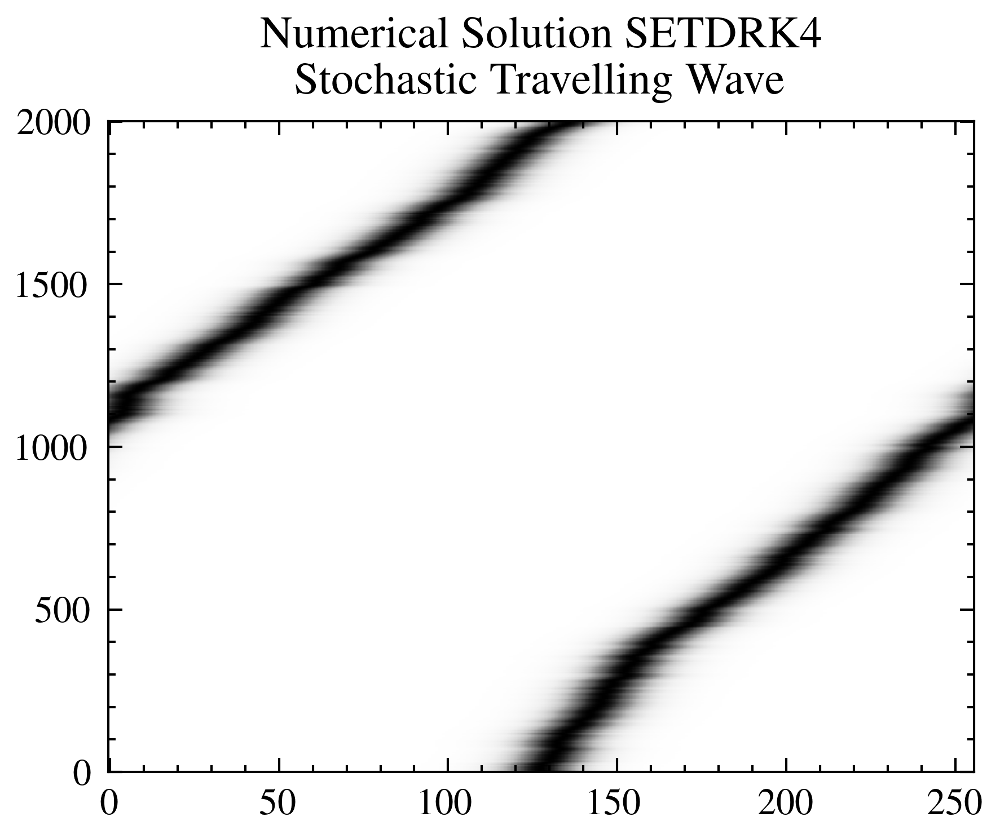

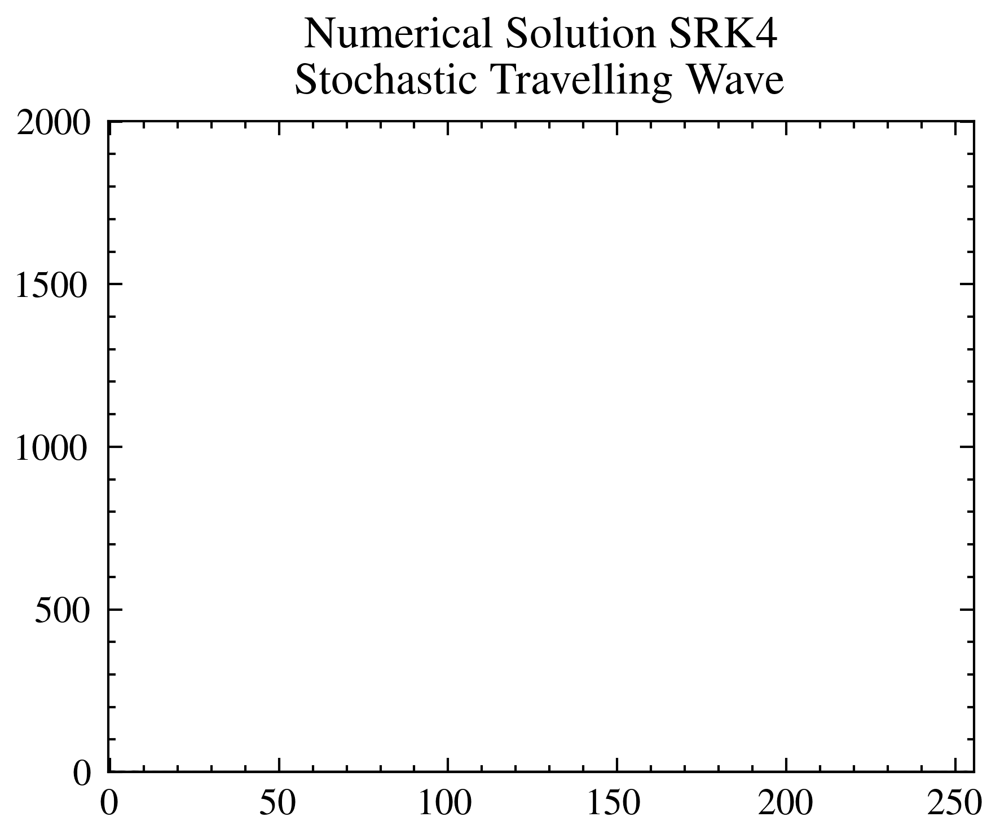

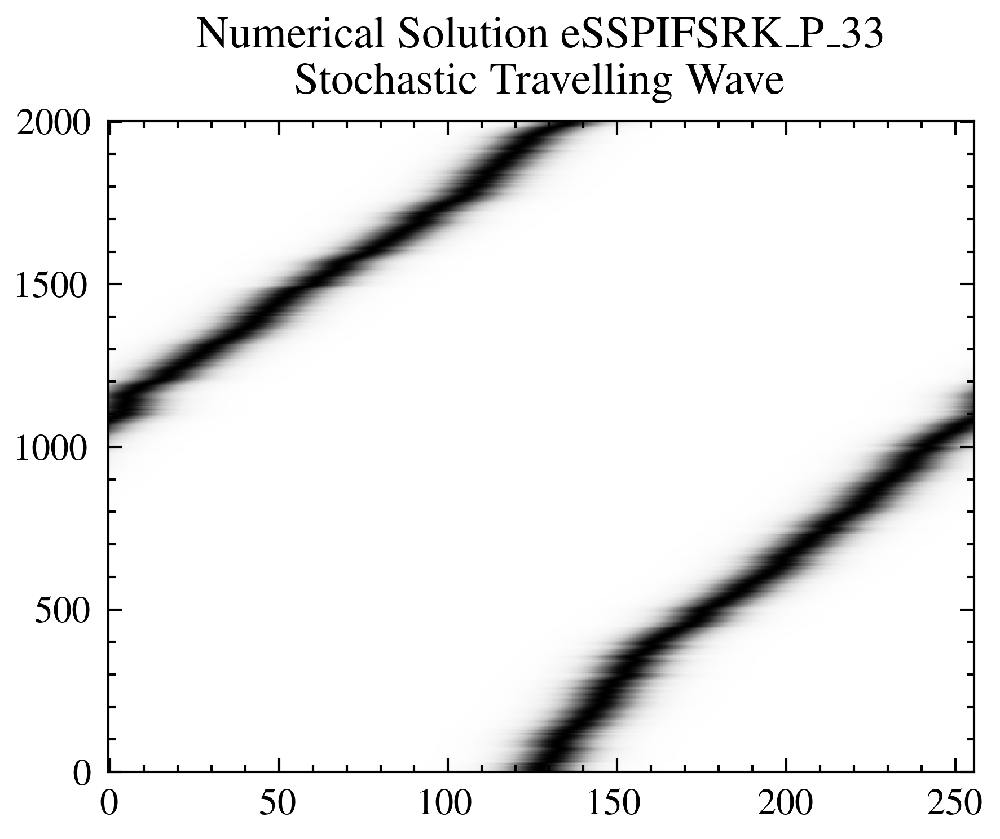

dt: 5e-05 nt 2000 Tmax 0.1
array: [0.00217198 0.00017626 0.         0.         0.         0.
 0.         0.         0.         0.        ] [8.68759424e-04 7.95195943e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan  0.  0.  0.  0.  0.  0.  0.  0.] [       nan 0.00881063 0.         0.         0.         0.
 0.         0.         0.         0.        ]


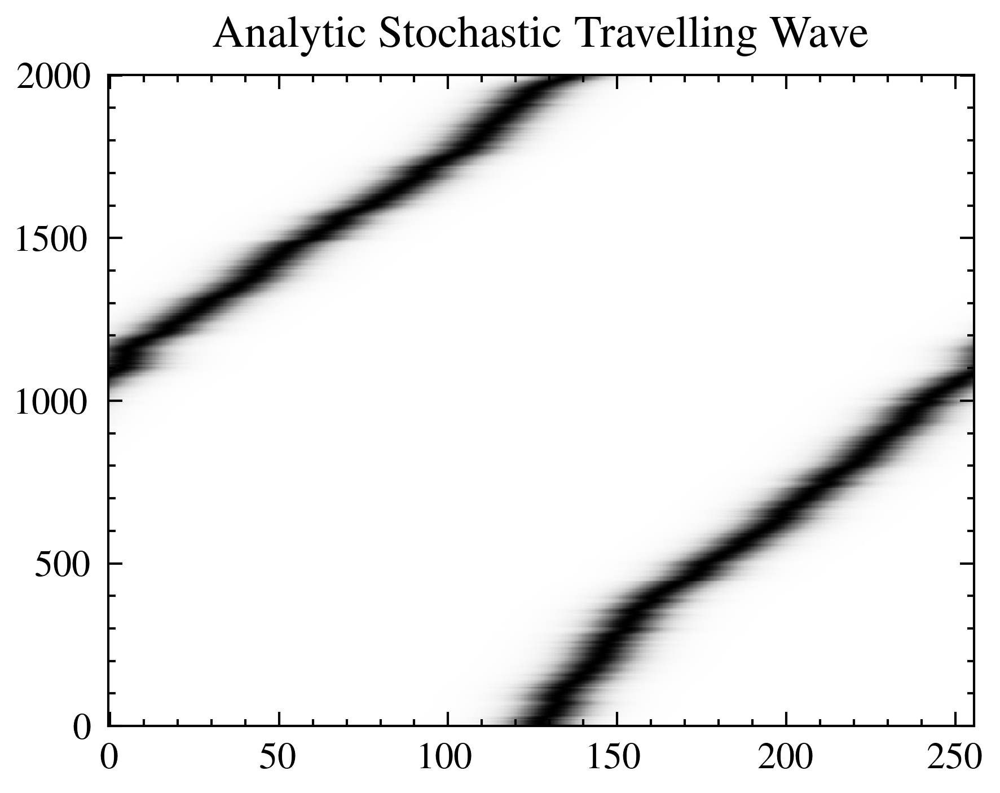

4000


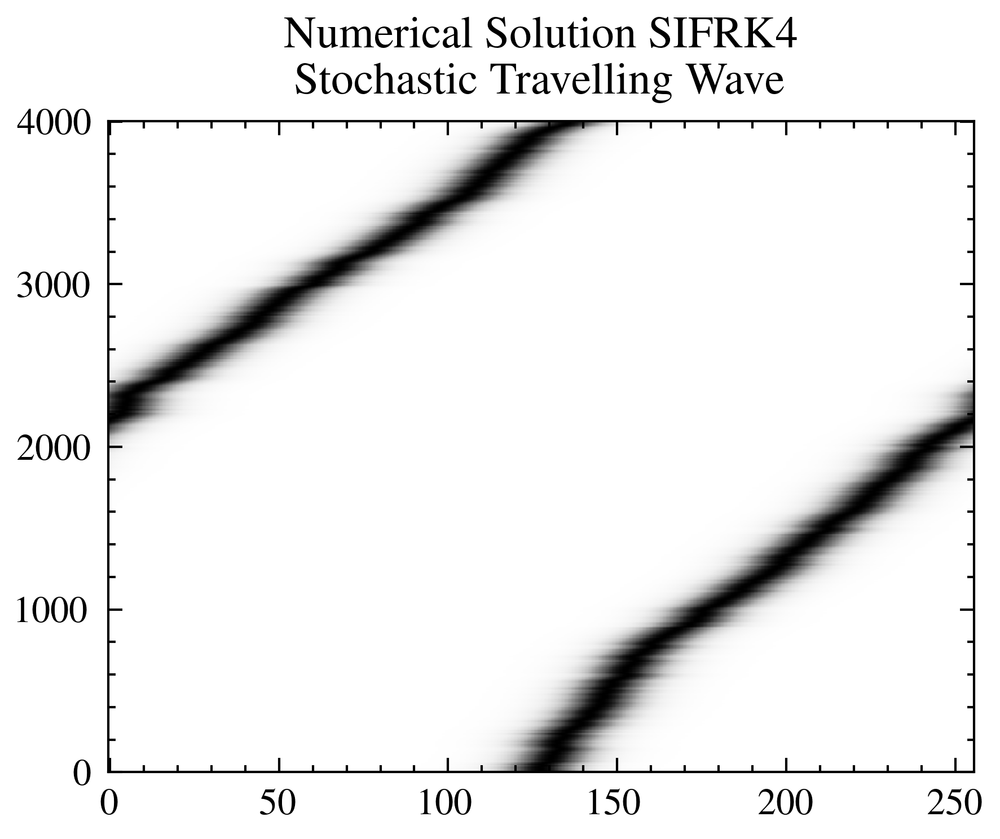

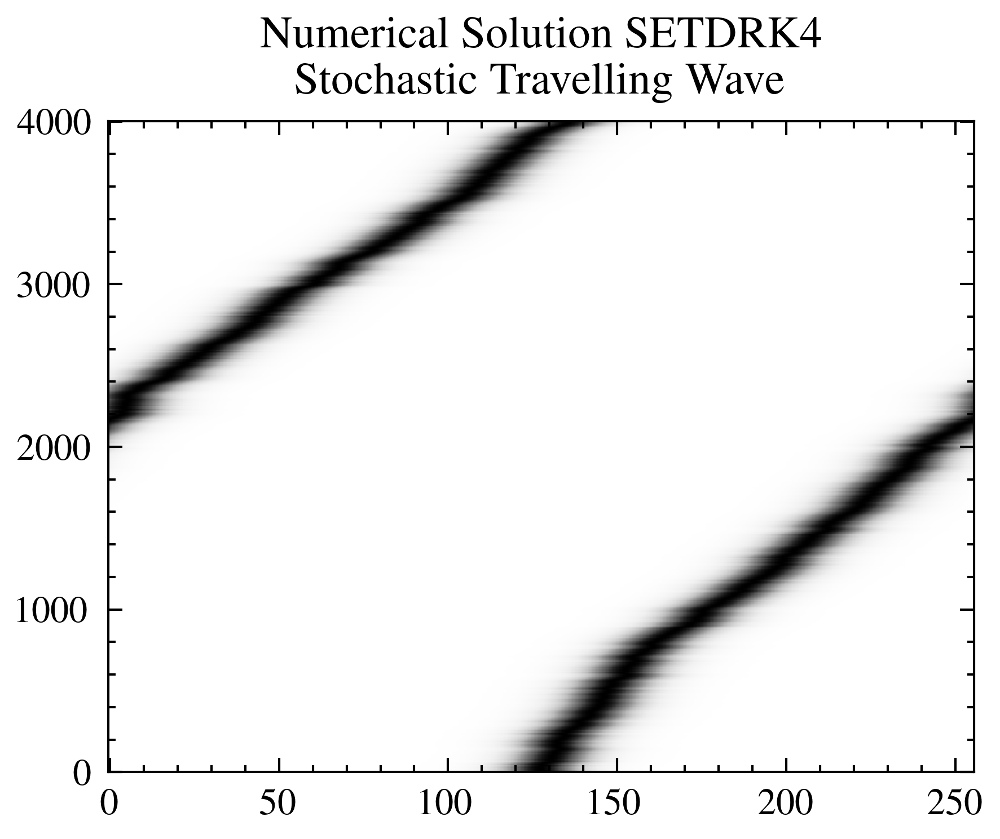

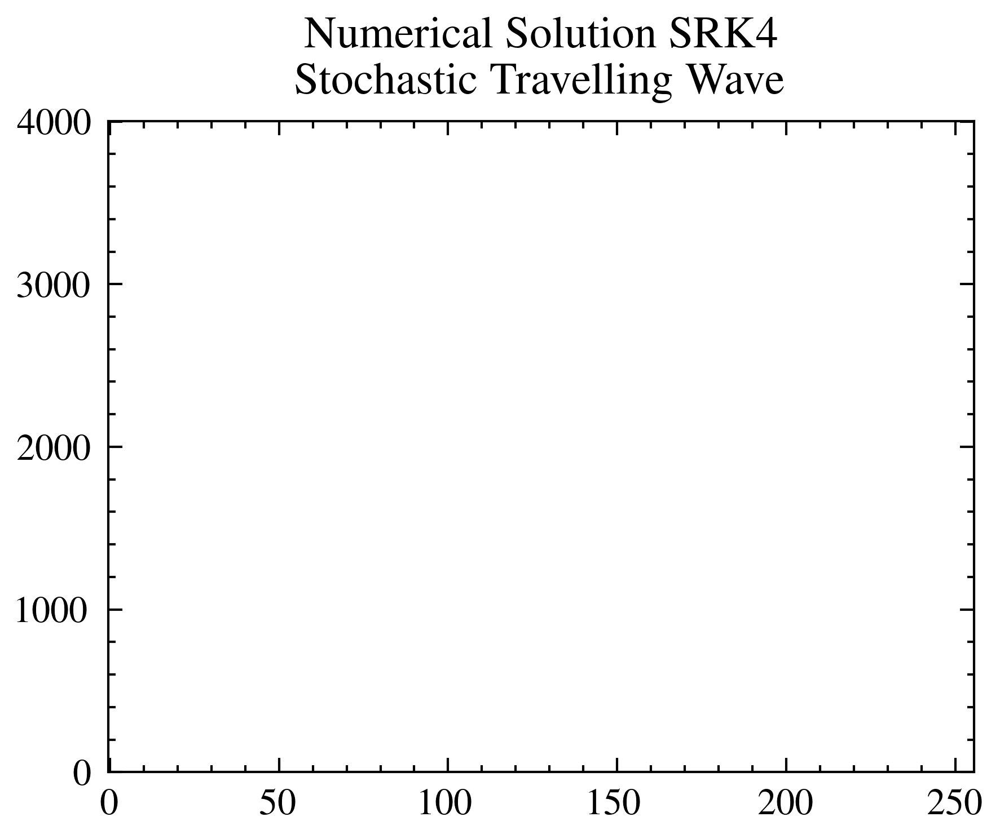

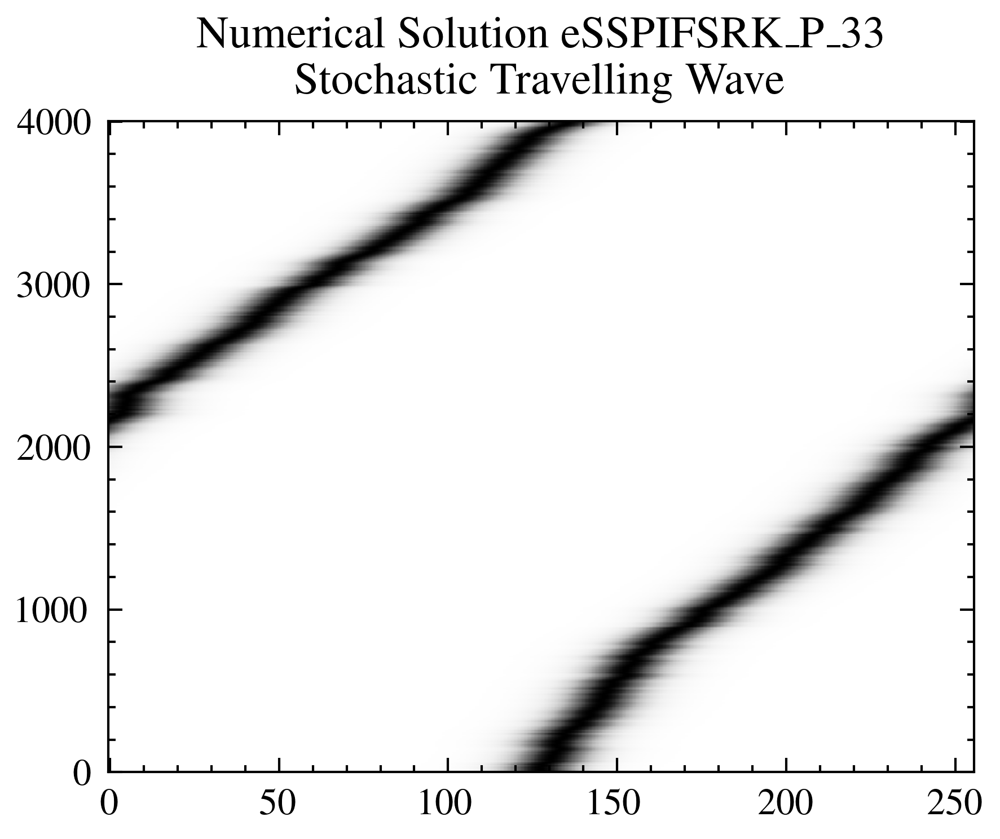

dt: 2.5e-05 nt 4000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan nan  0.  0.  0.  0.  0.  0.  0.] [       nan 0.00881063 0.0026311  0.         0.         0.
 0.         0.         0.         0.        ]


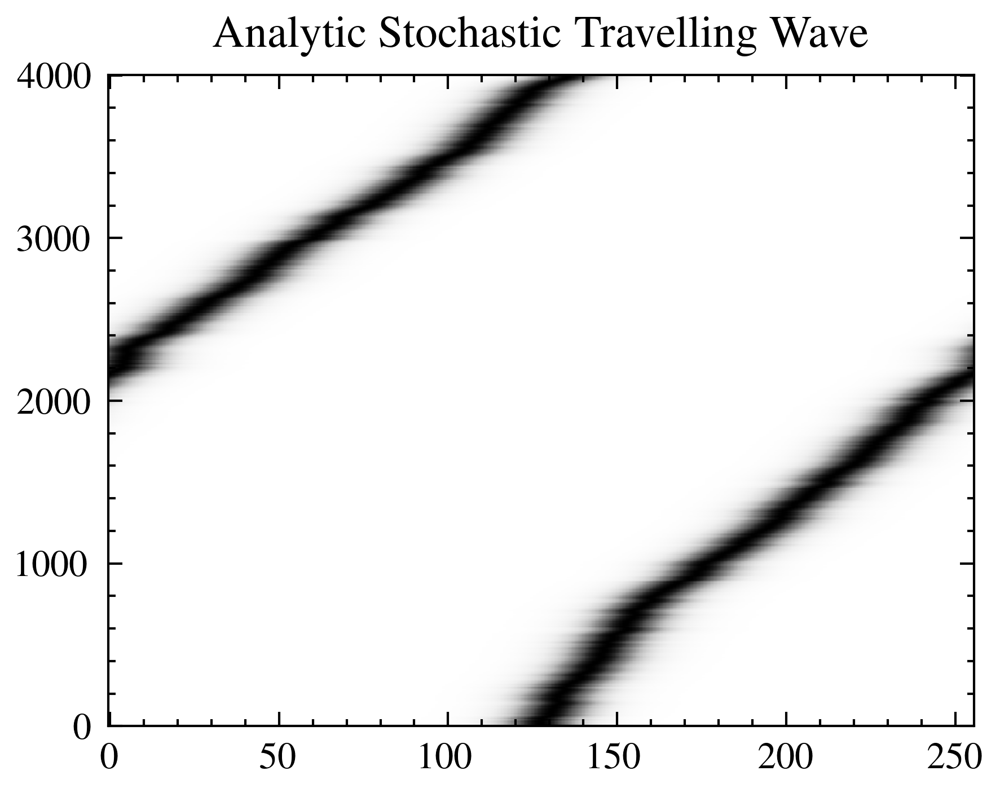

8000


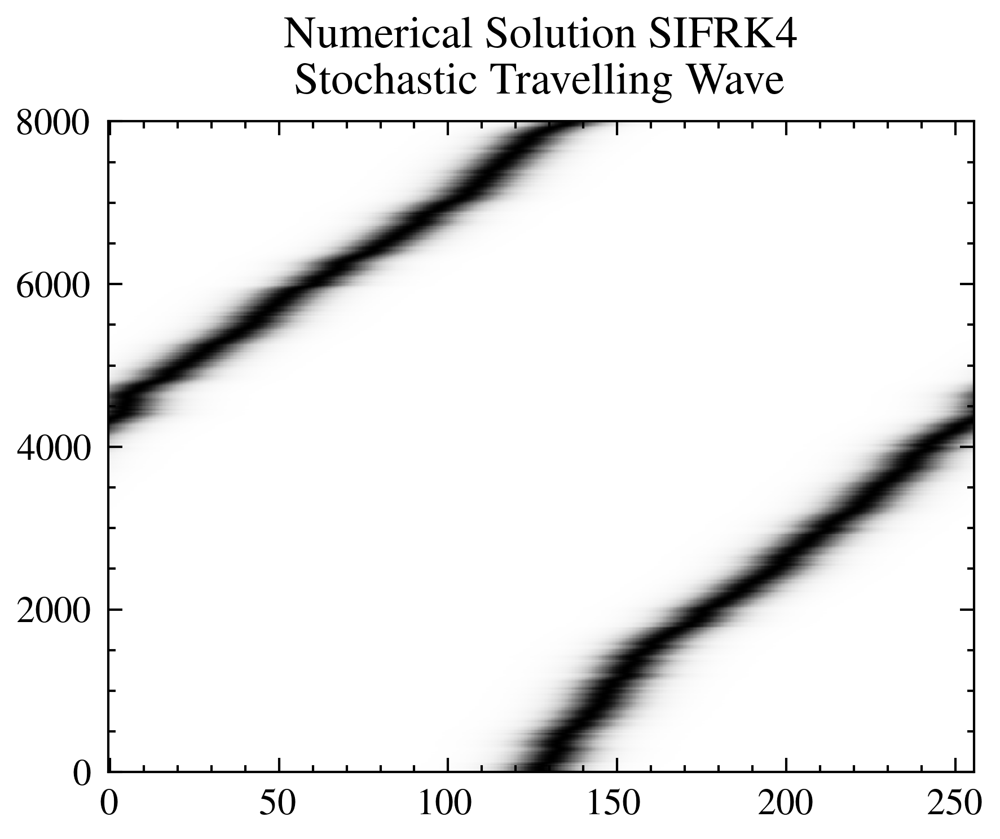

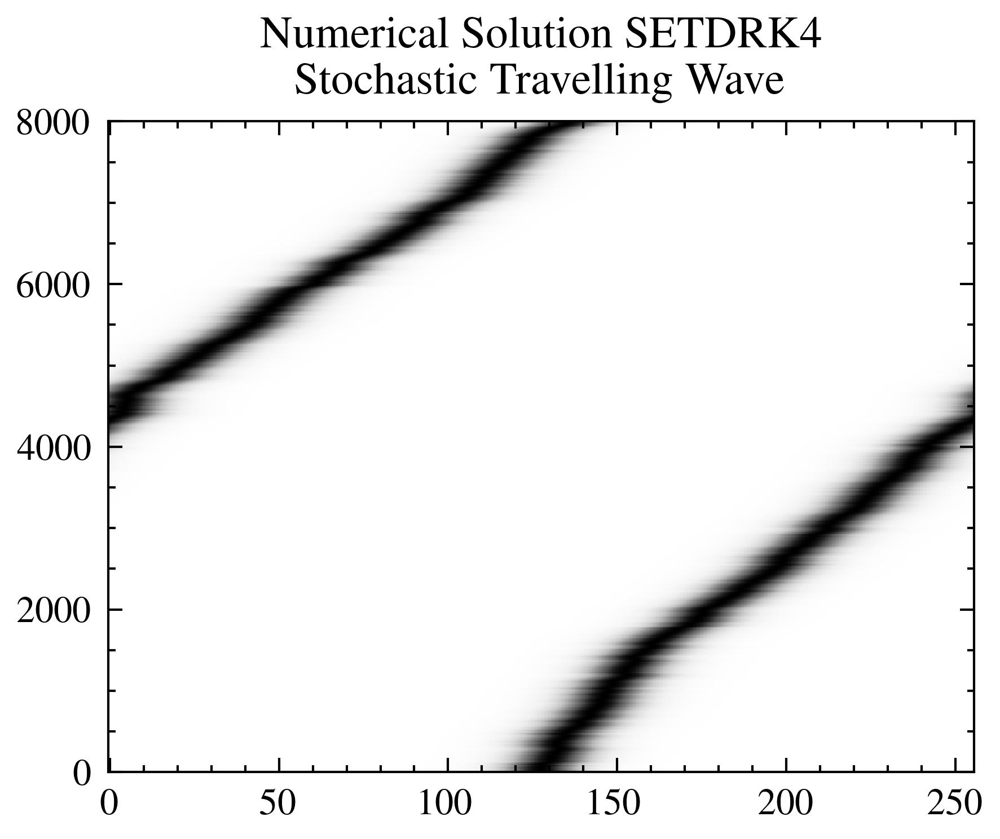

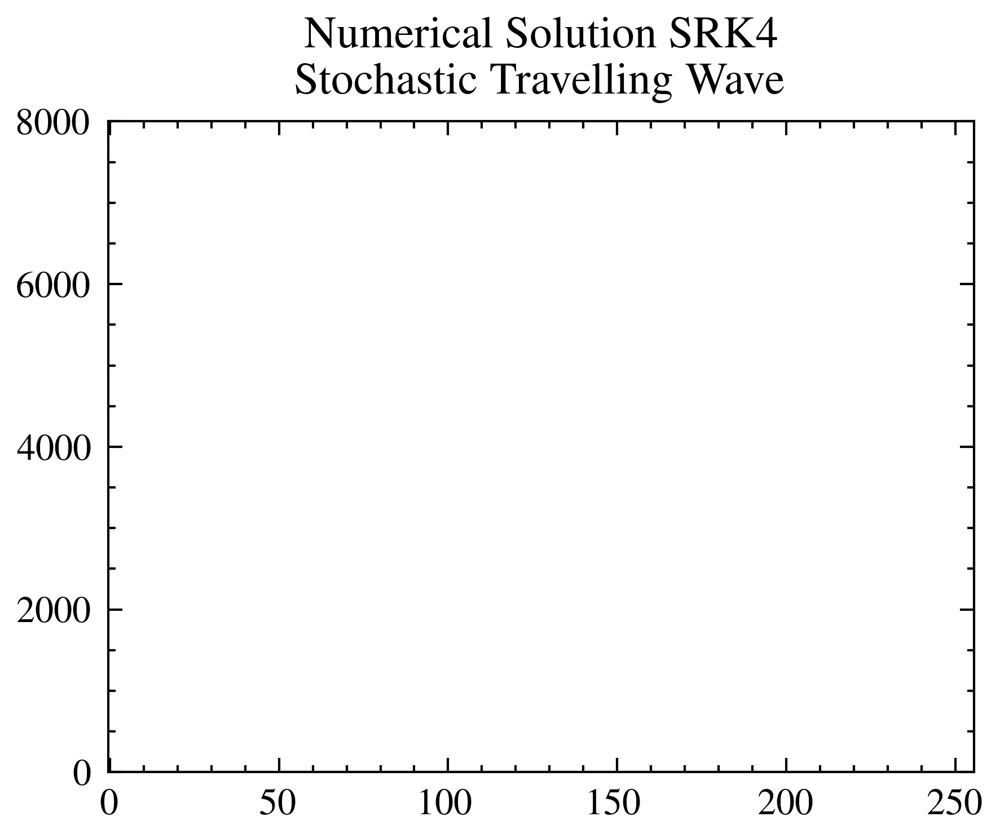

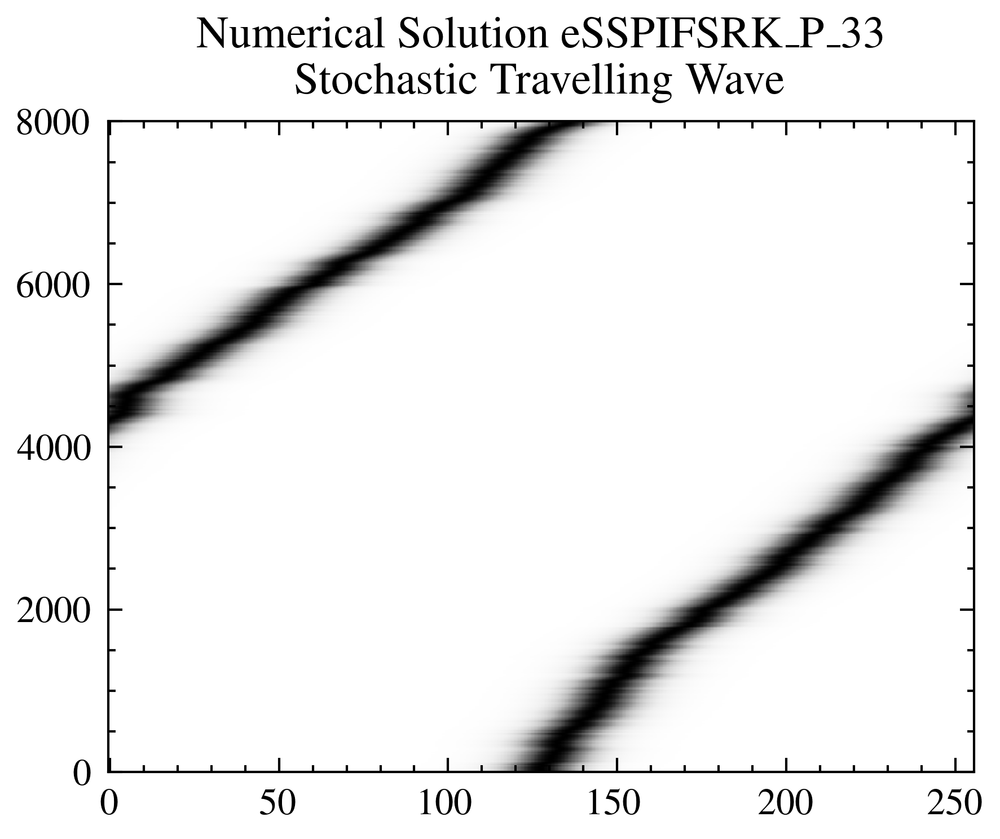

dt: 1.25e-05 nt 8000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan nan nan  0.  0.  0.  0.  0.  0.] [       nan 0.00881063 0.0026311  0.00096716 0.         0.
 0.         0.         0.         0.        ]


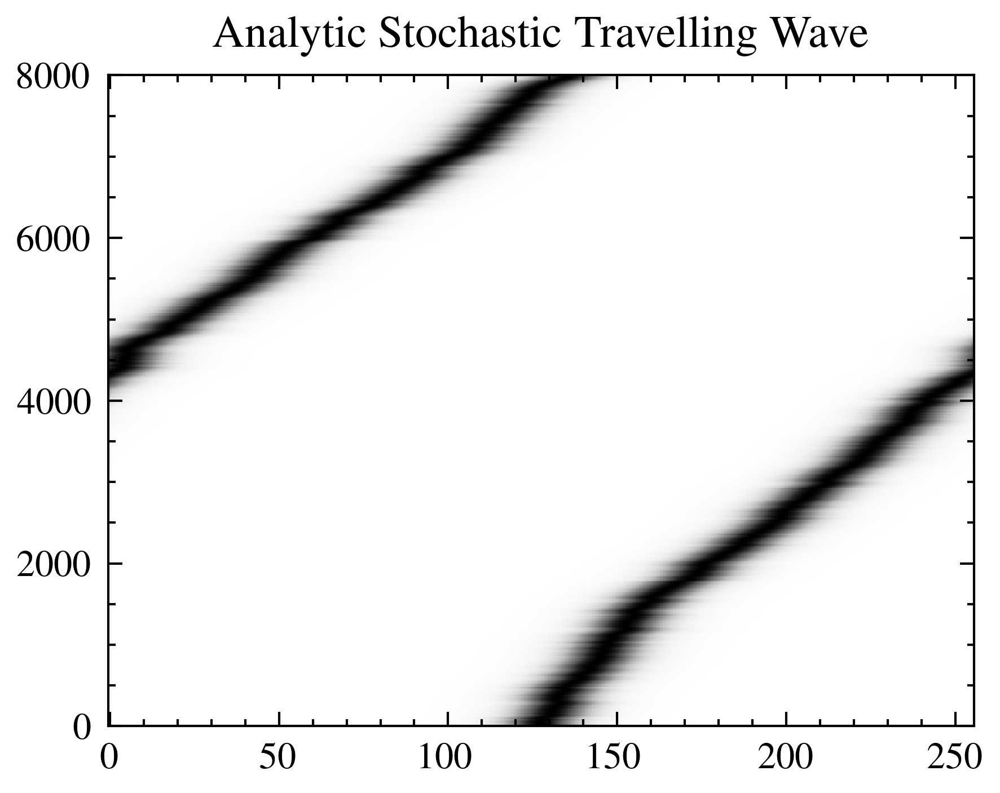

16000


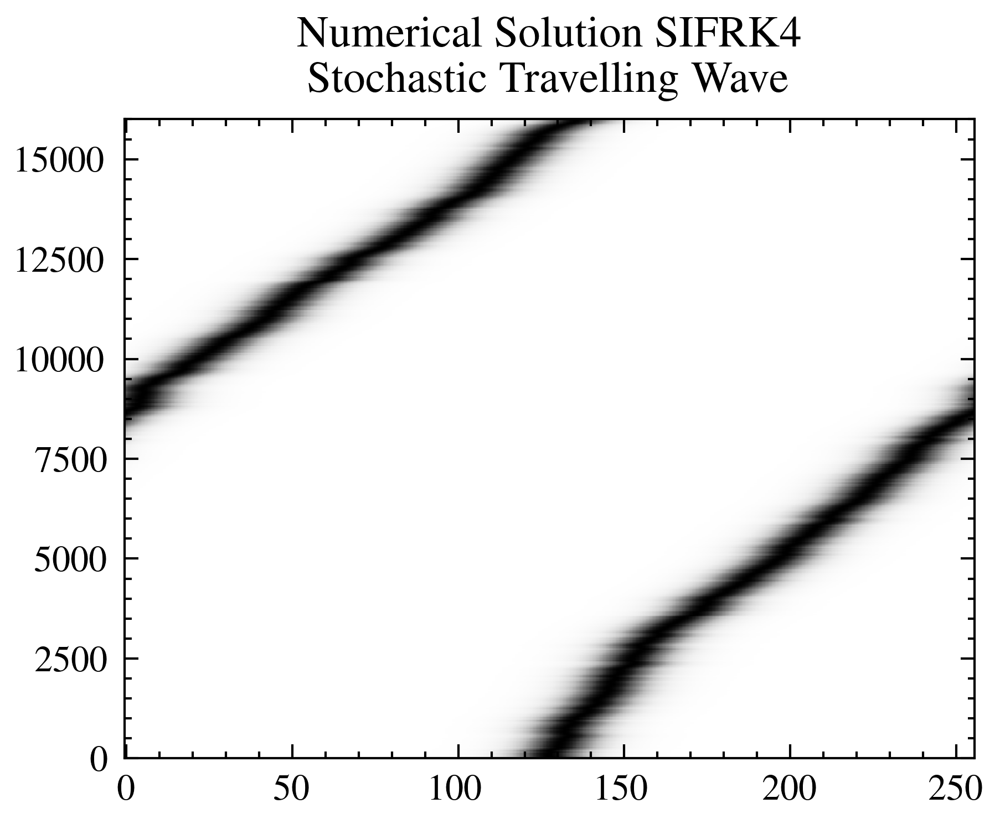

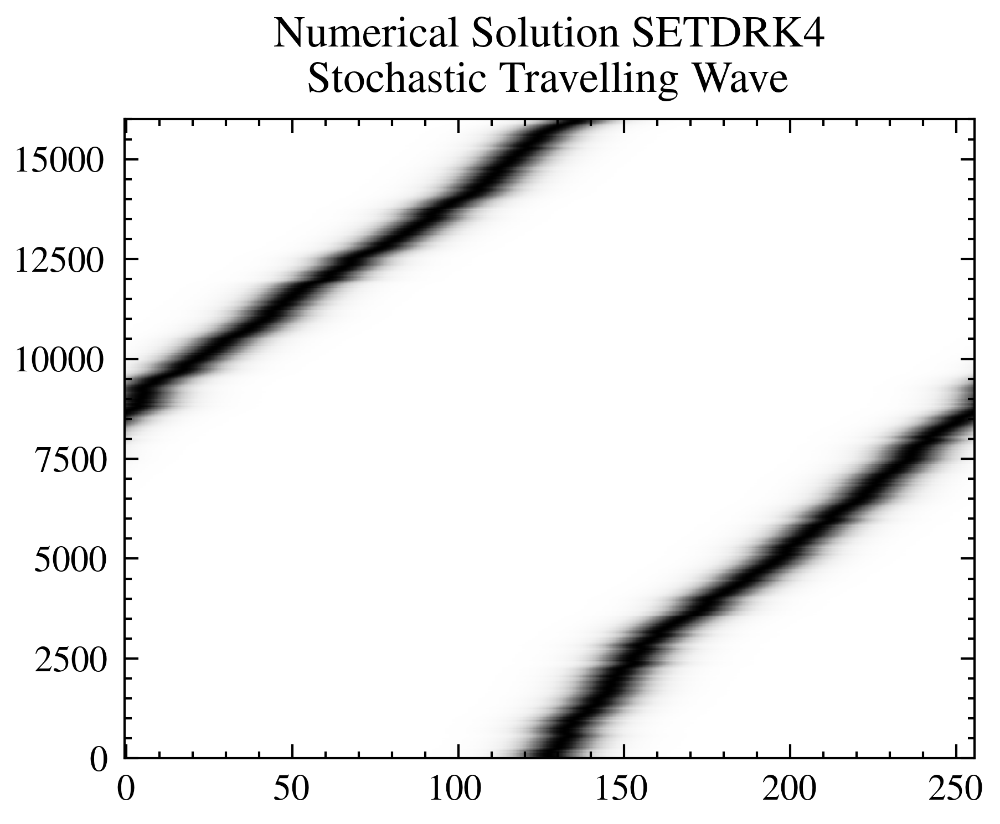

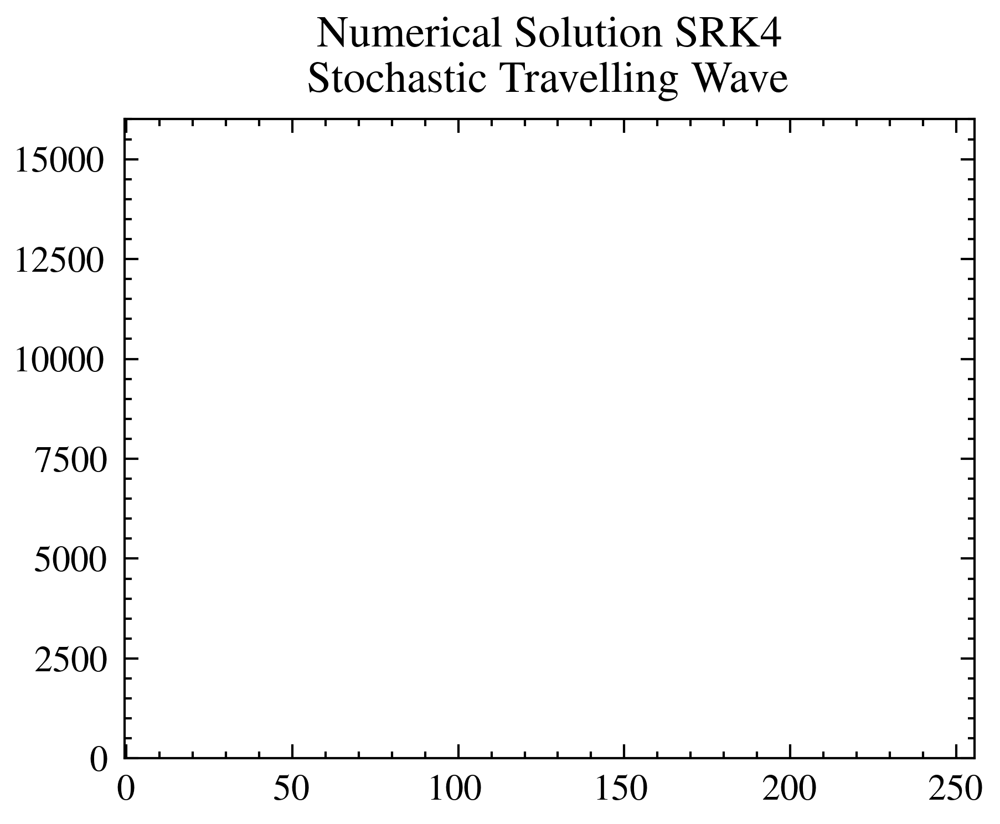

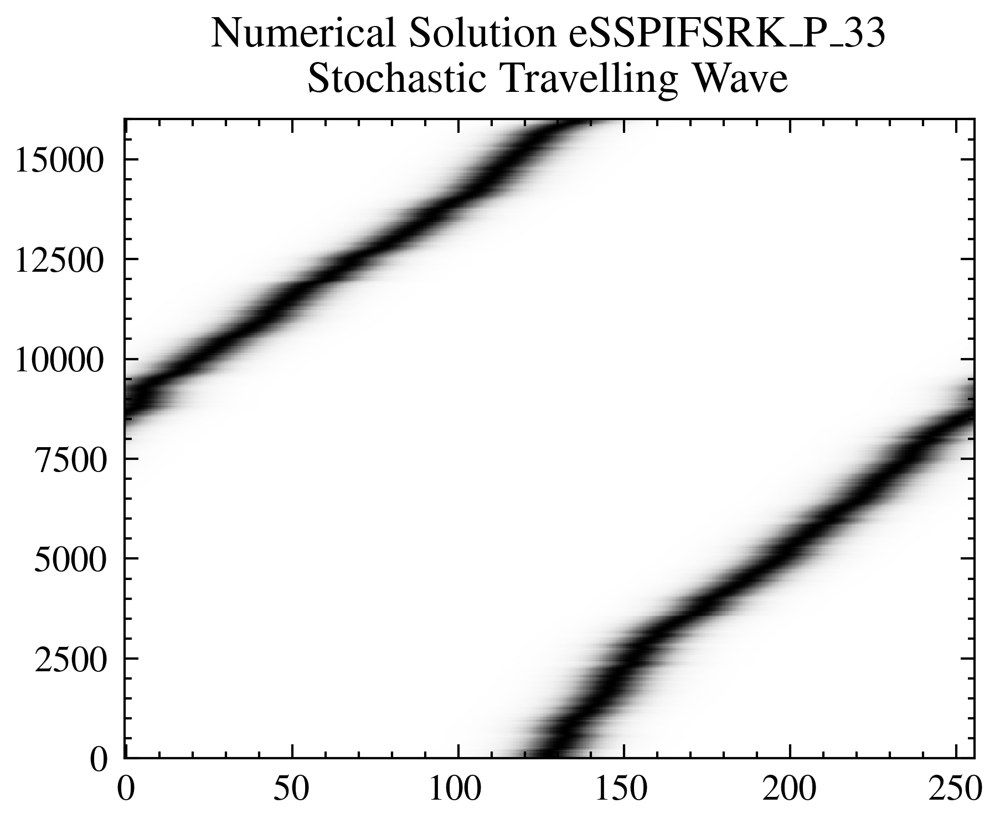

dt: 6.25e-06 nt 16000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan  0.  0.  0.  0.  0.] [       nan 0.00881063 0.0026311  0.00096716 0.00038329 0.
 0.         0.         0.         0.        ]


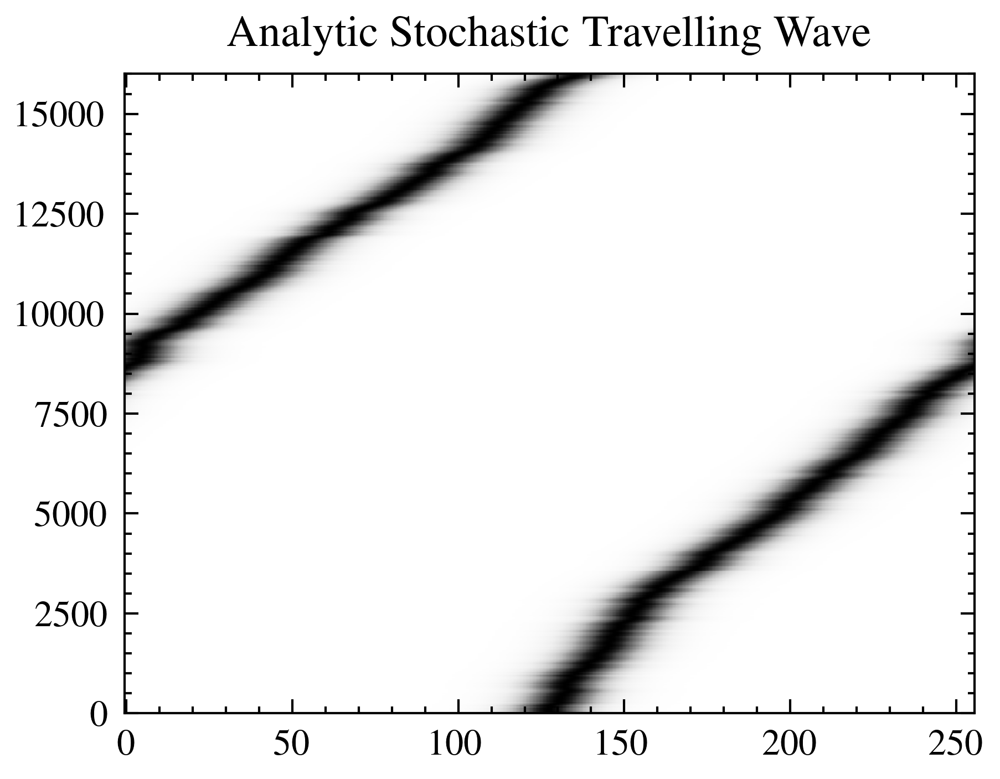

32000


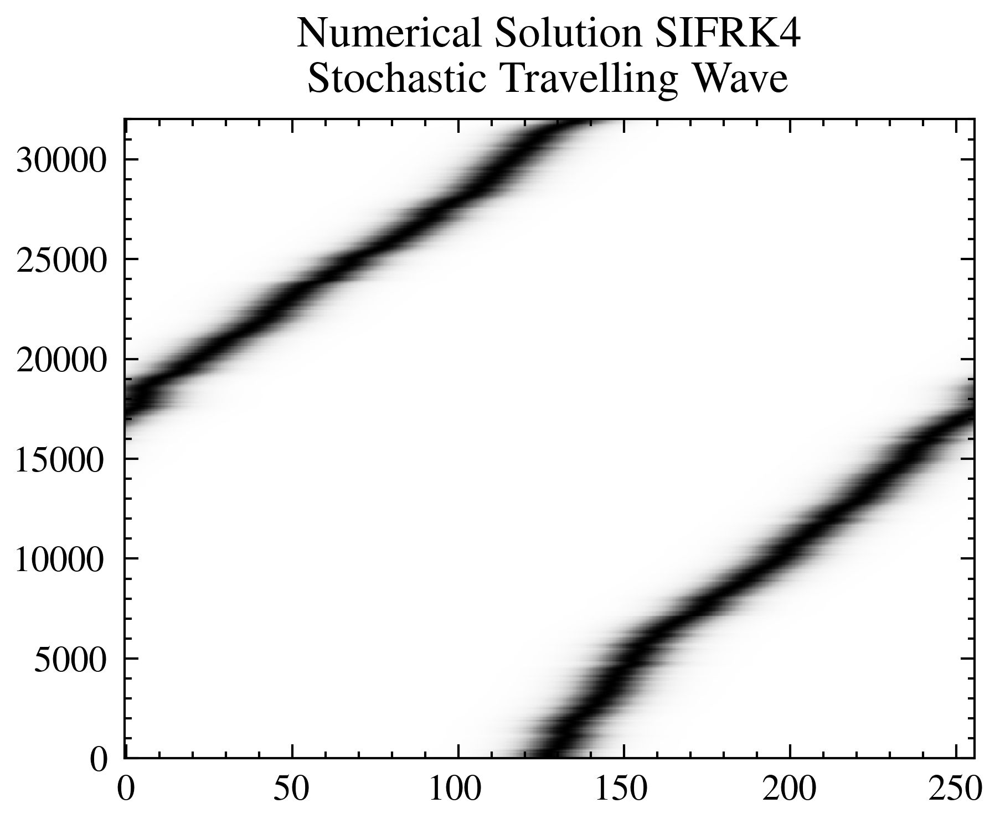

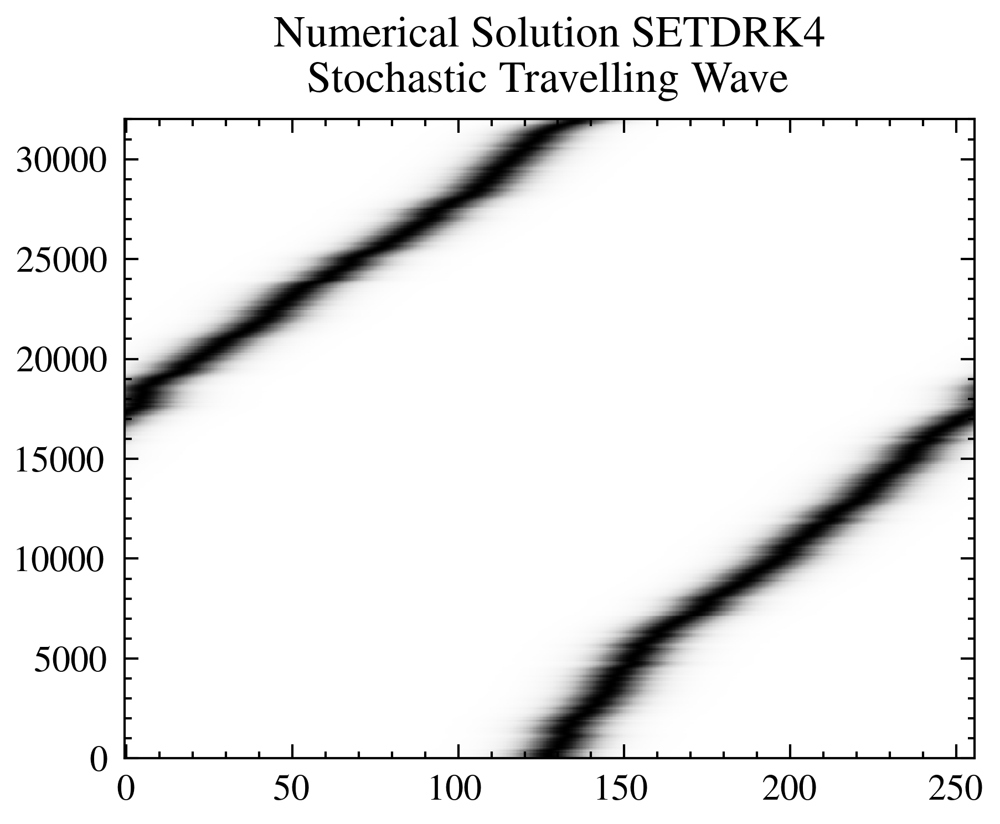

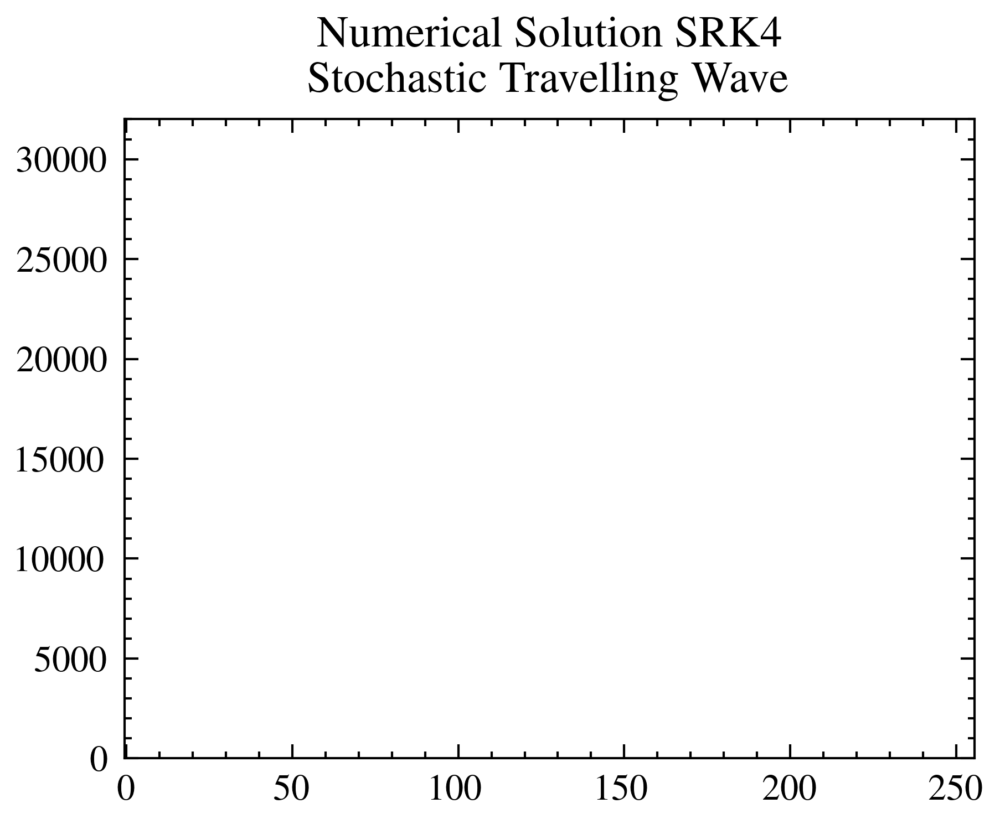

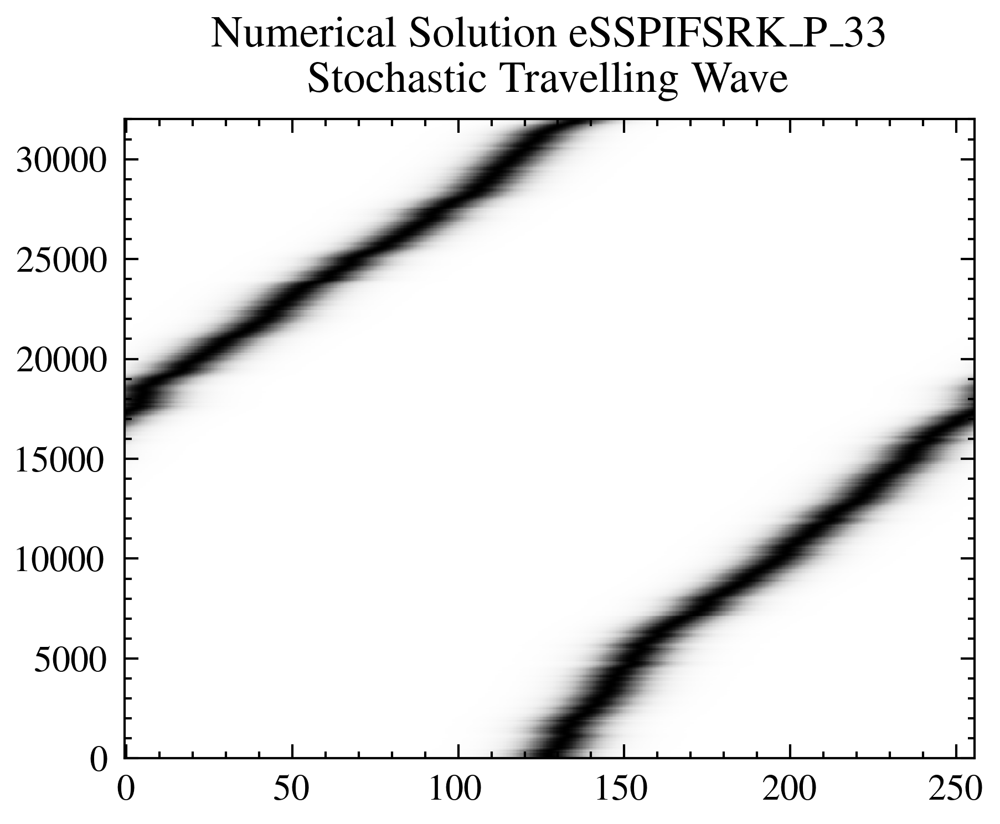

dt: 3.125e-06 nt 32000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan  0.  0.  0.  0.] [       nan 0.00881063 0.0026311  0.00096716 0.00038329 0.00017251
 0.         0.         0.         0.        ]


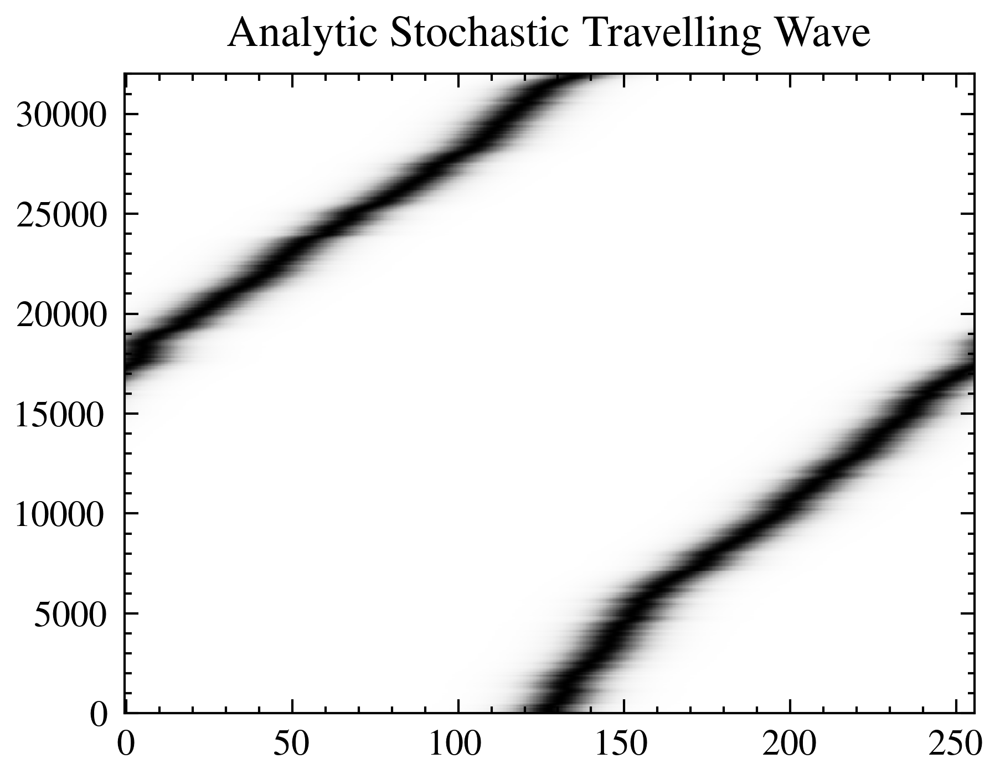

64000


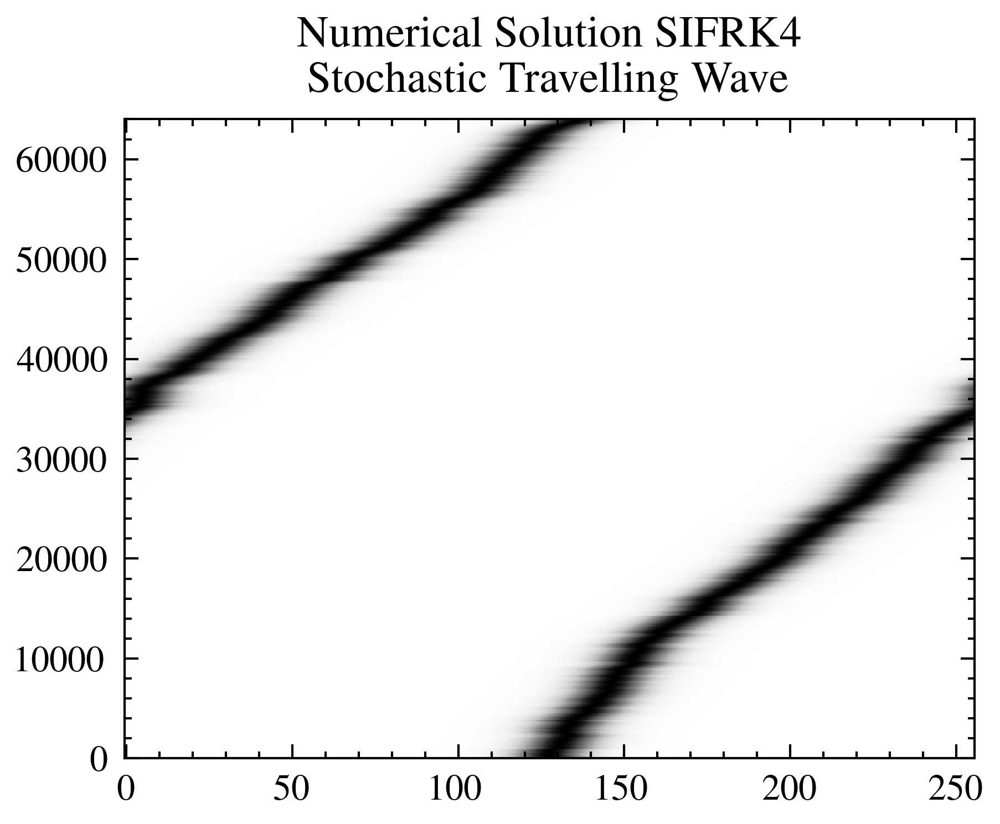

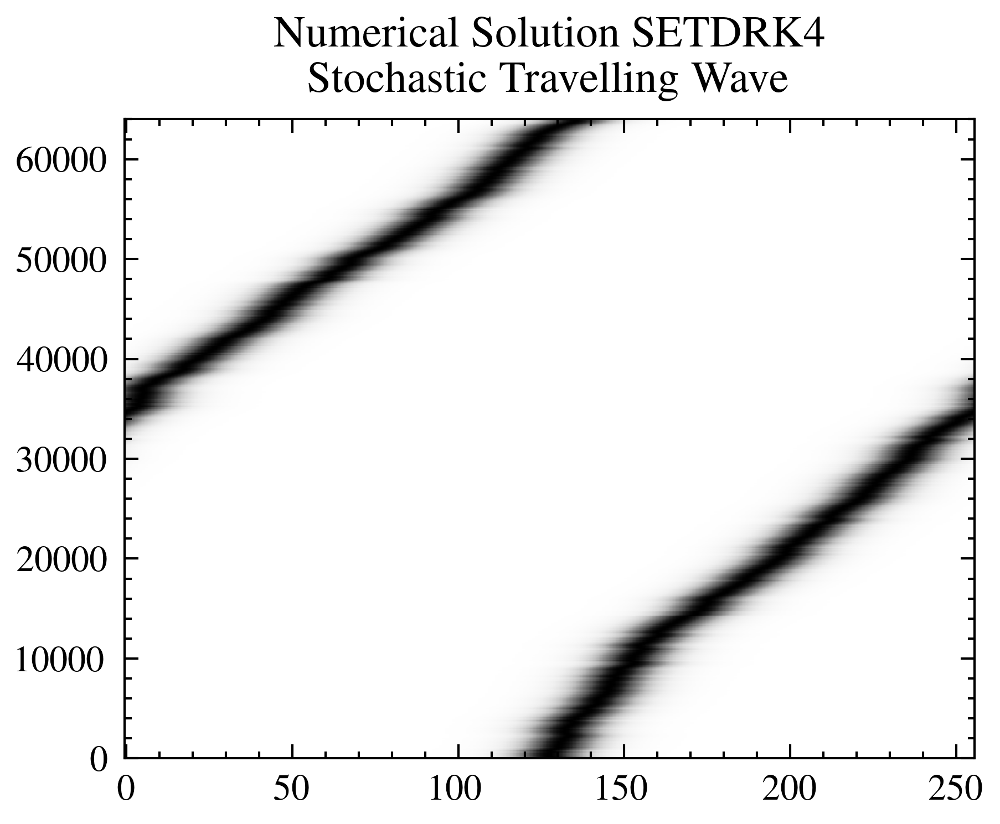

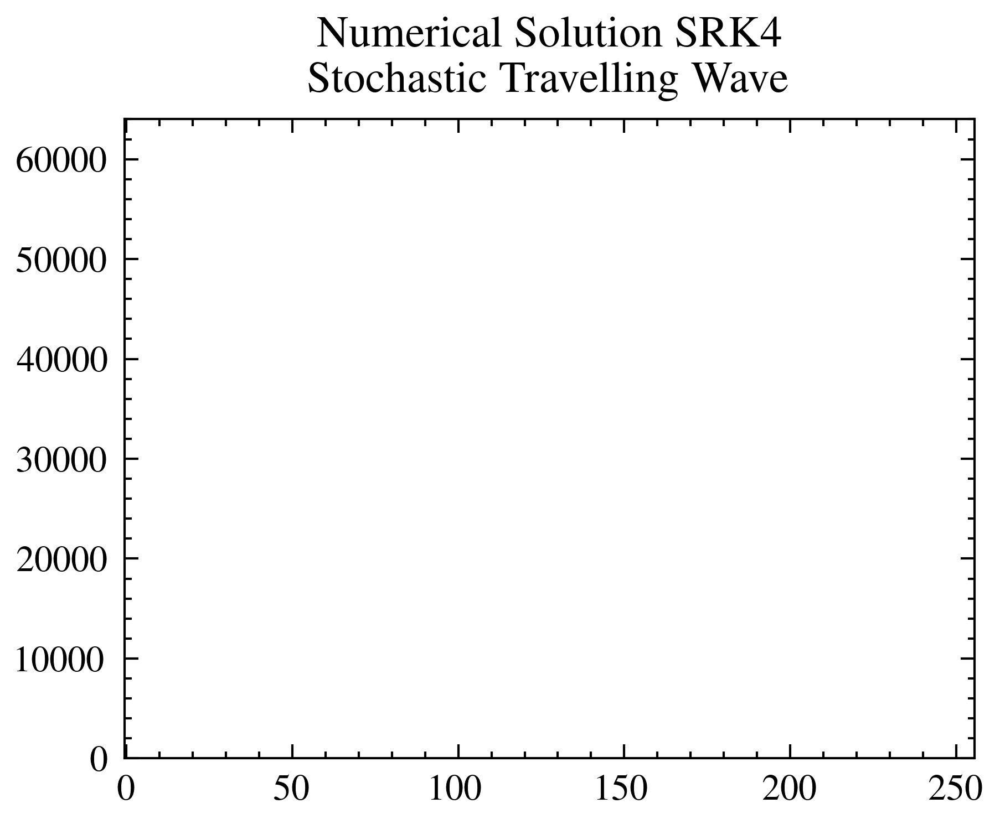

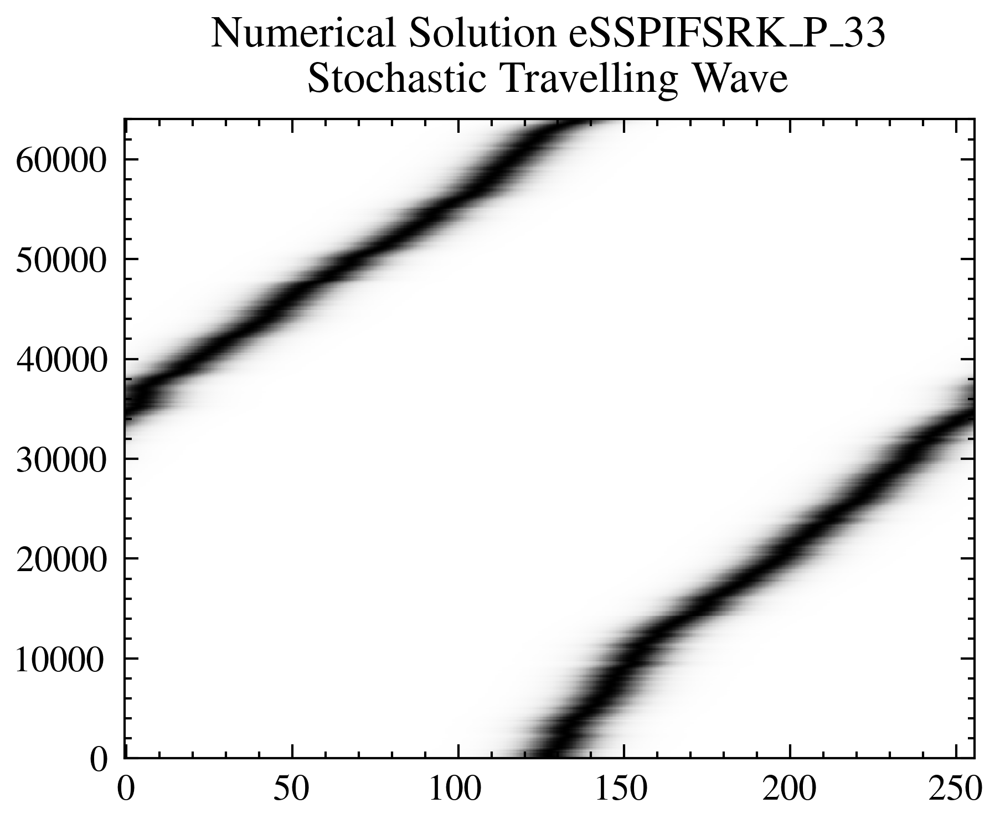

dt: 1.5625e-06 nt 64000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 0.00000000e+00
 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan nan  0.  0.  0.] [           nan 8.81062567e-03 2.63110328e-03 9.67156597e-04
 3.83289130e-04 1.72508643e-04 8.07749700e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00]


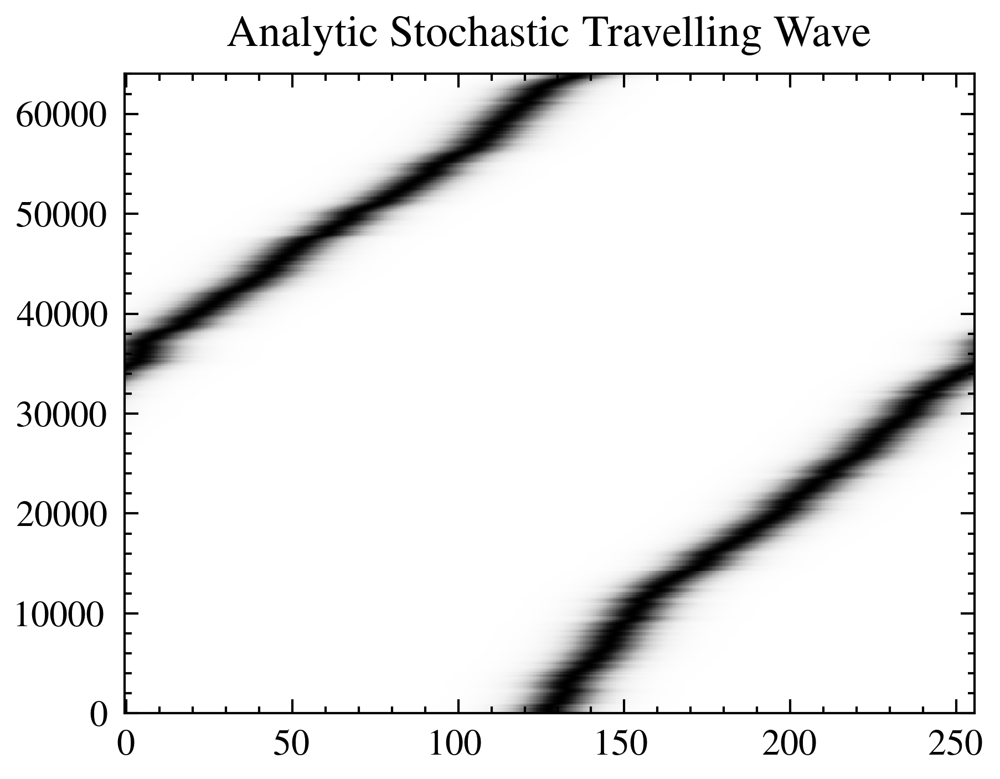

128000


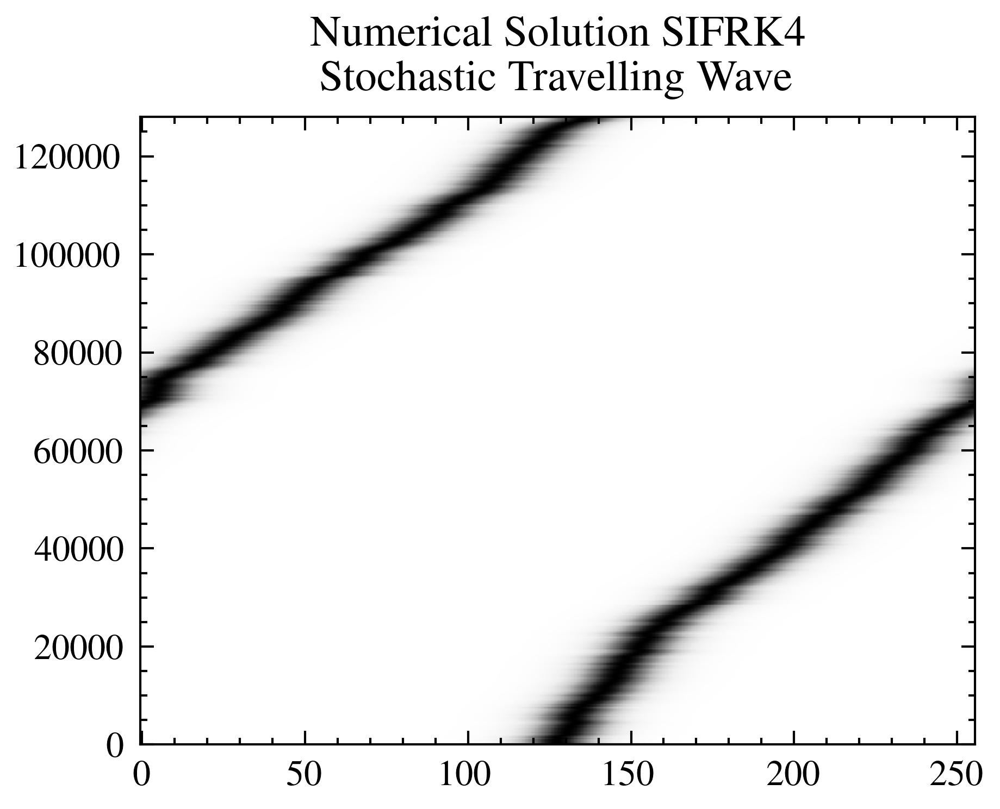

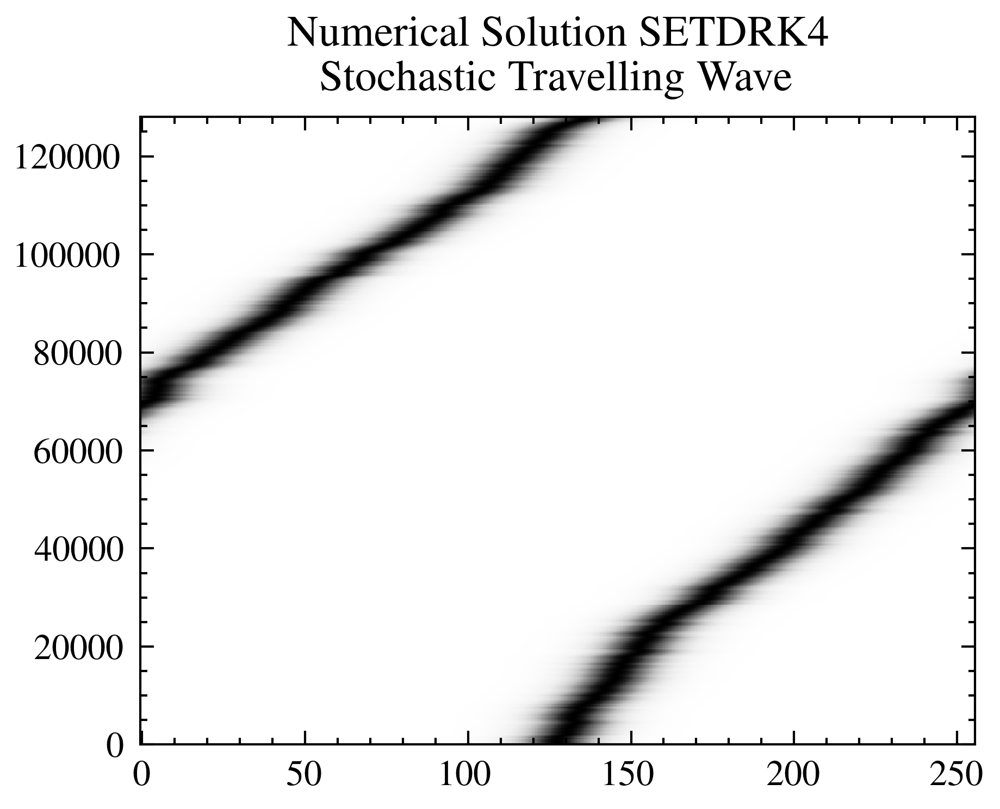

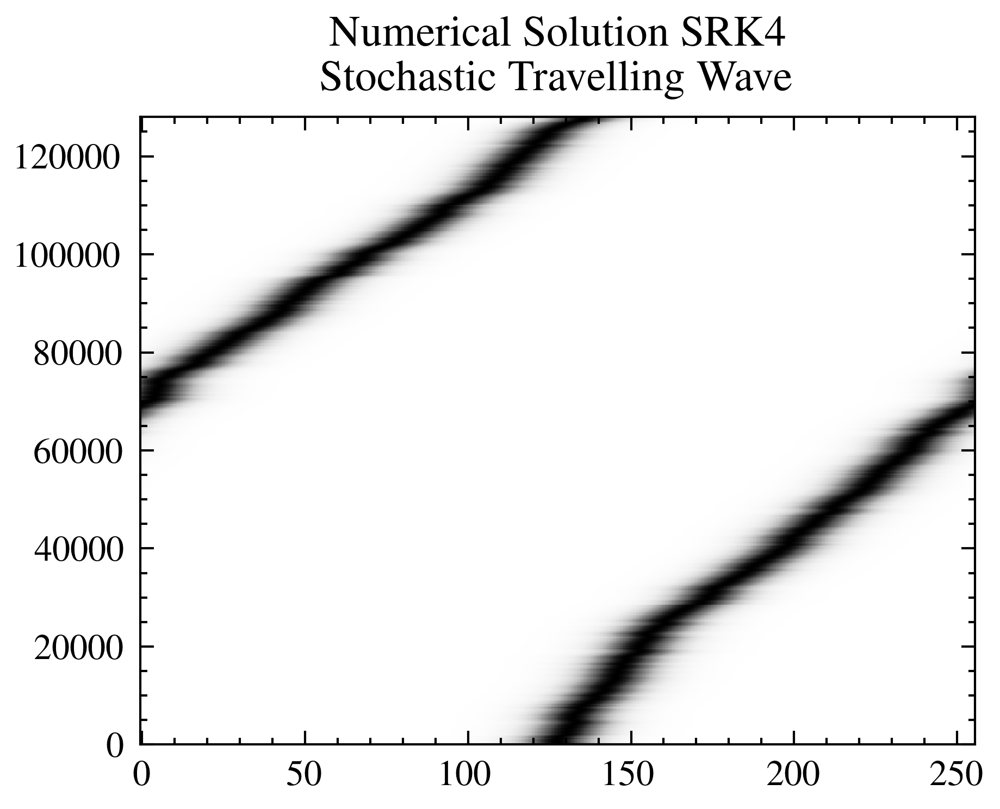

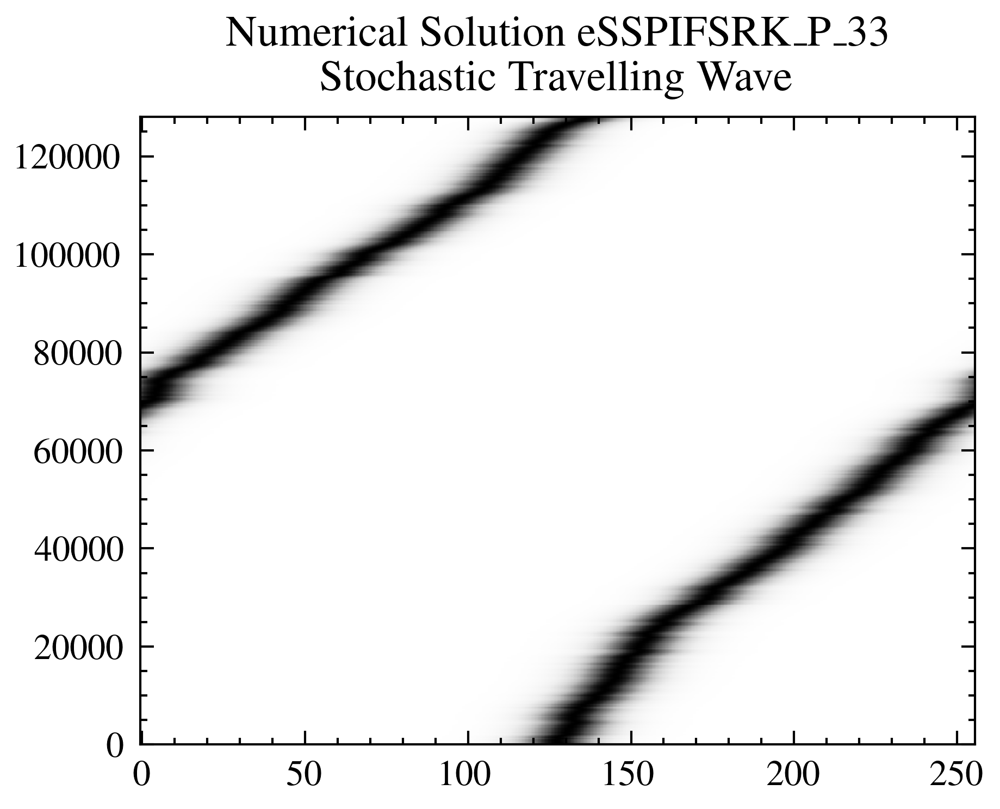

dt: 7.8125e-07 nt 128000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 6.66105492e-09
 0.00000000e+00 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 5.84706259e-09
 0.00000000e+00 0.00000000e+00] [           nan            nan            nan            nan
            nan            nan            nan 3.71496129e-09
 0.00000000e+00 0.00000000e+00] [           nan 8.81062567e-03 2.63110328e-03 9.67156597e-04
 3.83289130e-04 1.72508643e-04 8.07749700e-05 3.86069017e-05
 0.00000000e+00 0.00000000e+00]


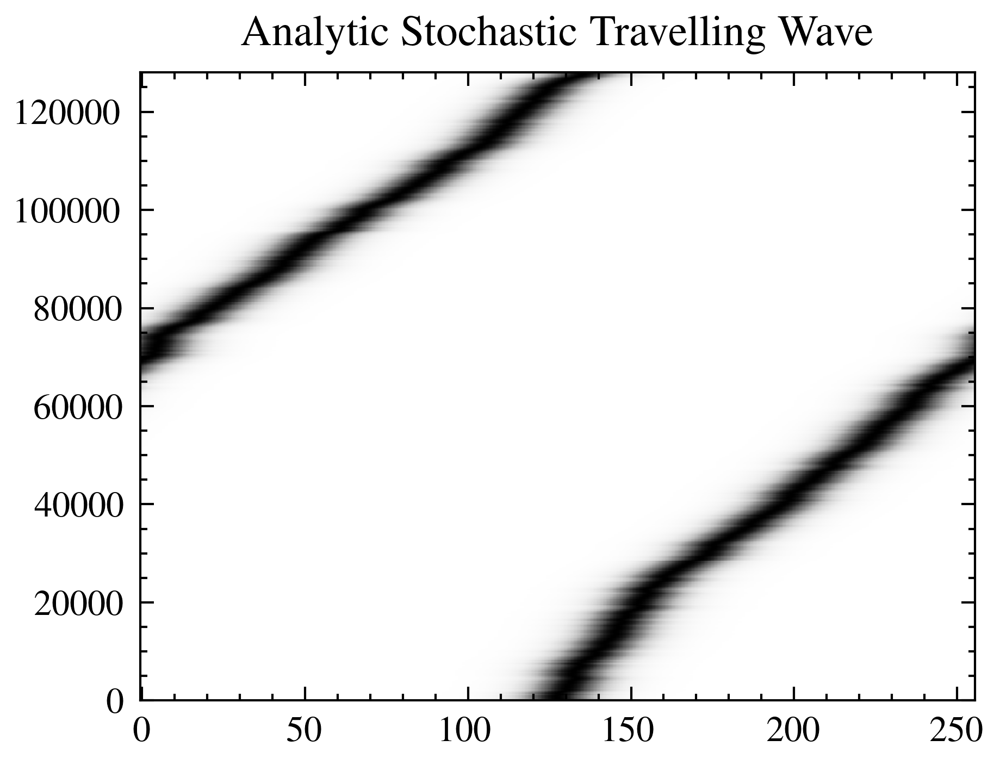

256000


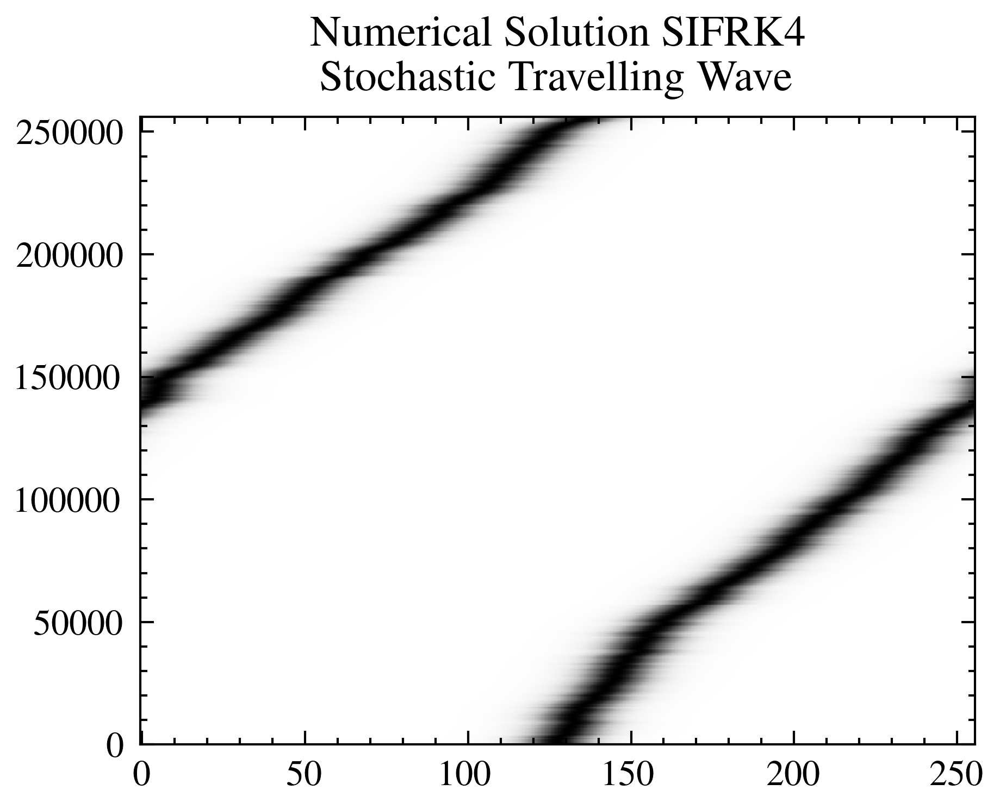

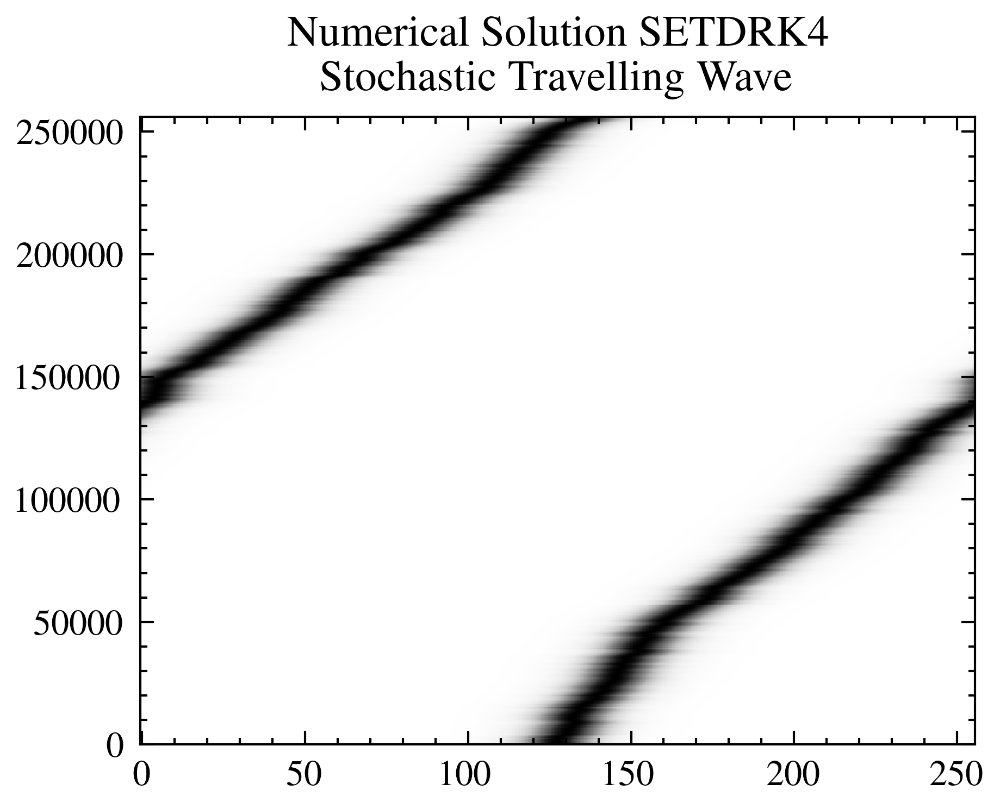

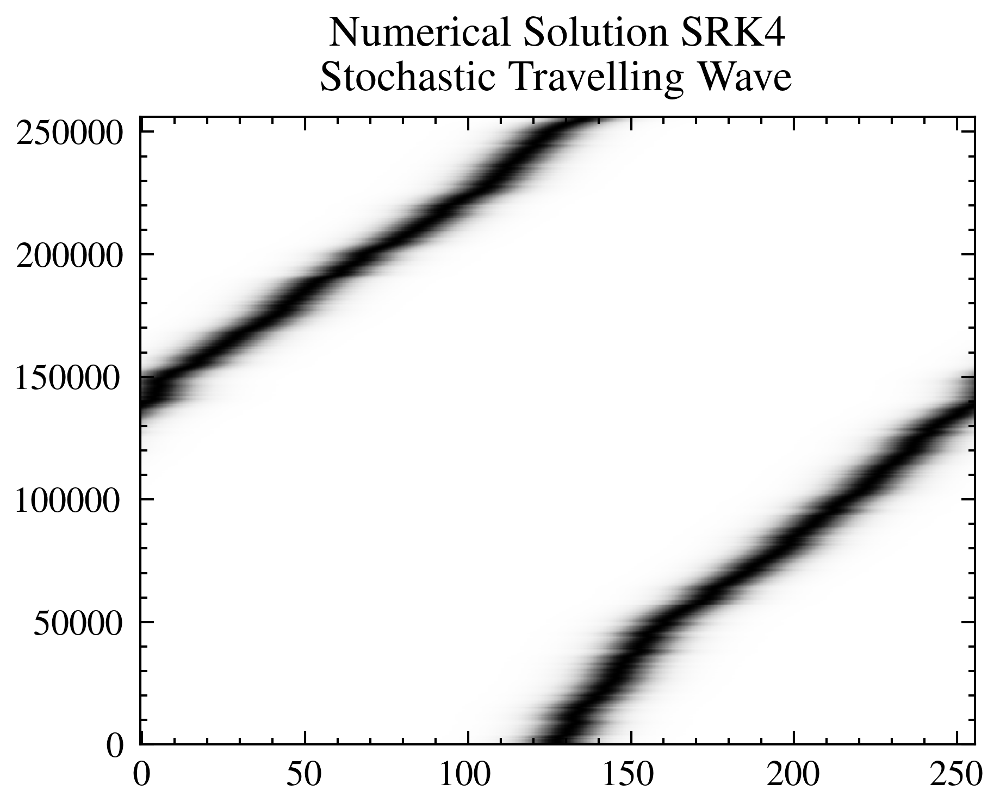

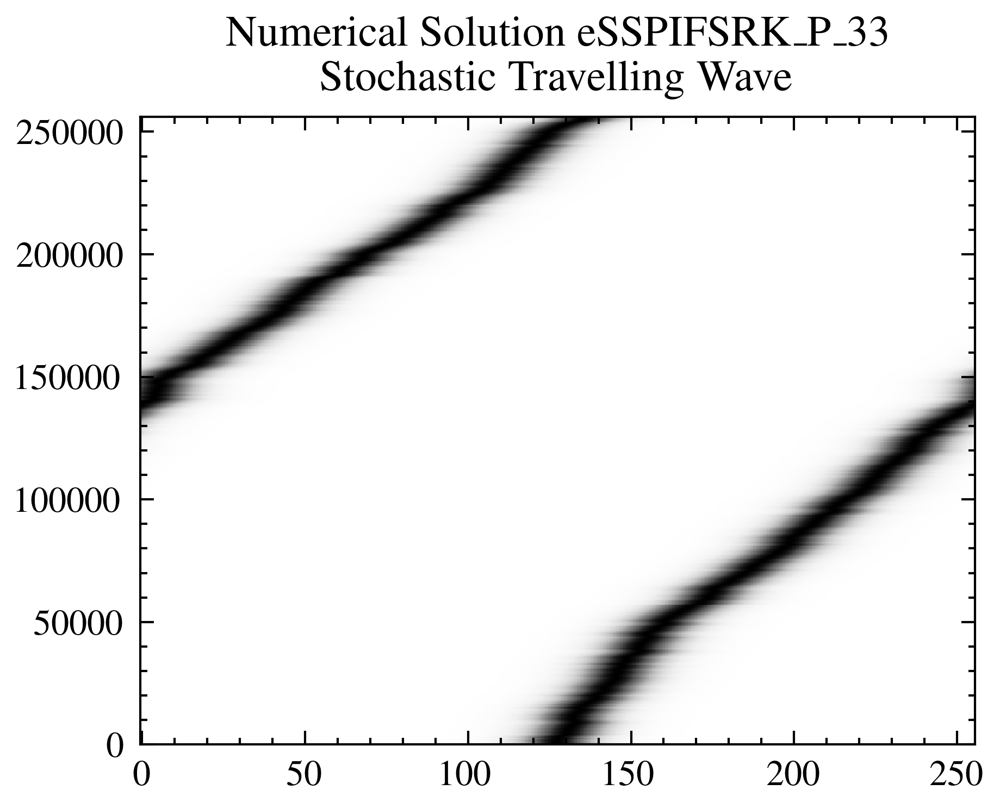

dt: 3.90625e-07 nt 256000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 6.66105492e-09
 1.60126722e-09 0.00000000e+00] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 5.84706259e-09
 1.41612908e-09 0.00000000e+00] [           nan            nan            nan            nan
            nan            nan            nan 3.71496129e-09
 9.26828962e-10 0.00000000e+00] [           nan 8.81062567e-03 2.63110328e-03 9.67156597e-04
 3.83289130e-04 1.72508643e-04 8.07749700e-05 3.86069017e-05
 1.90913824e-05 0.00000000e+00]


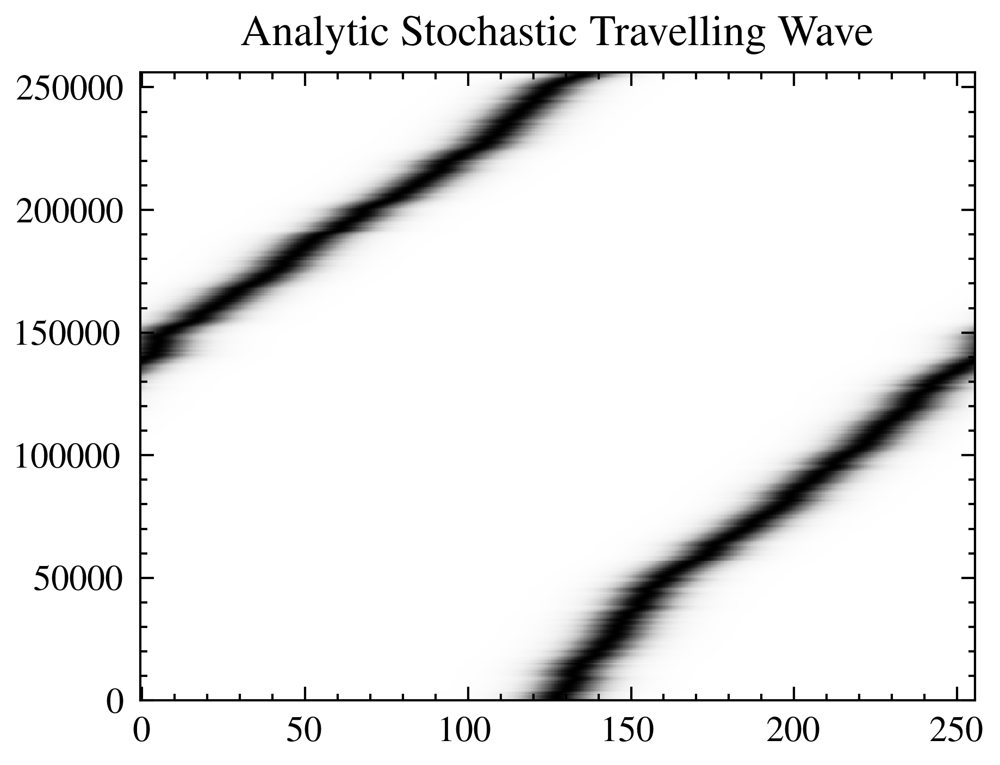

512000


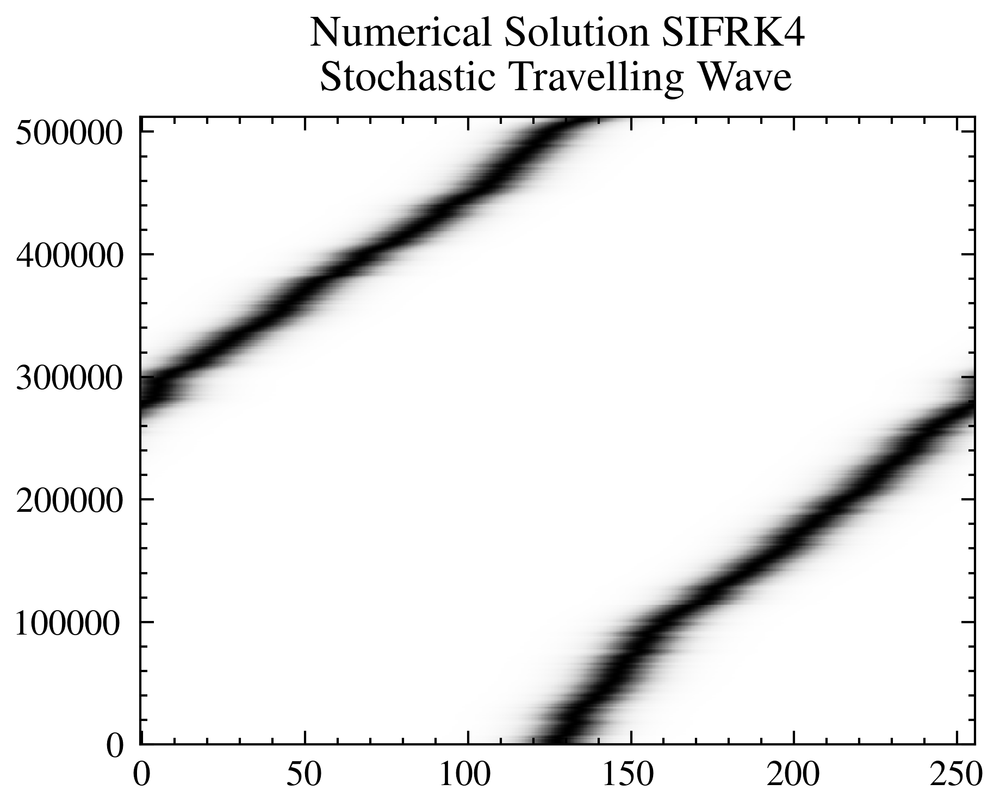

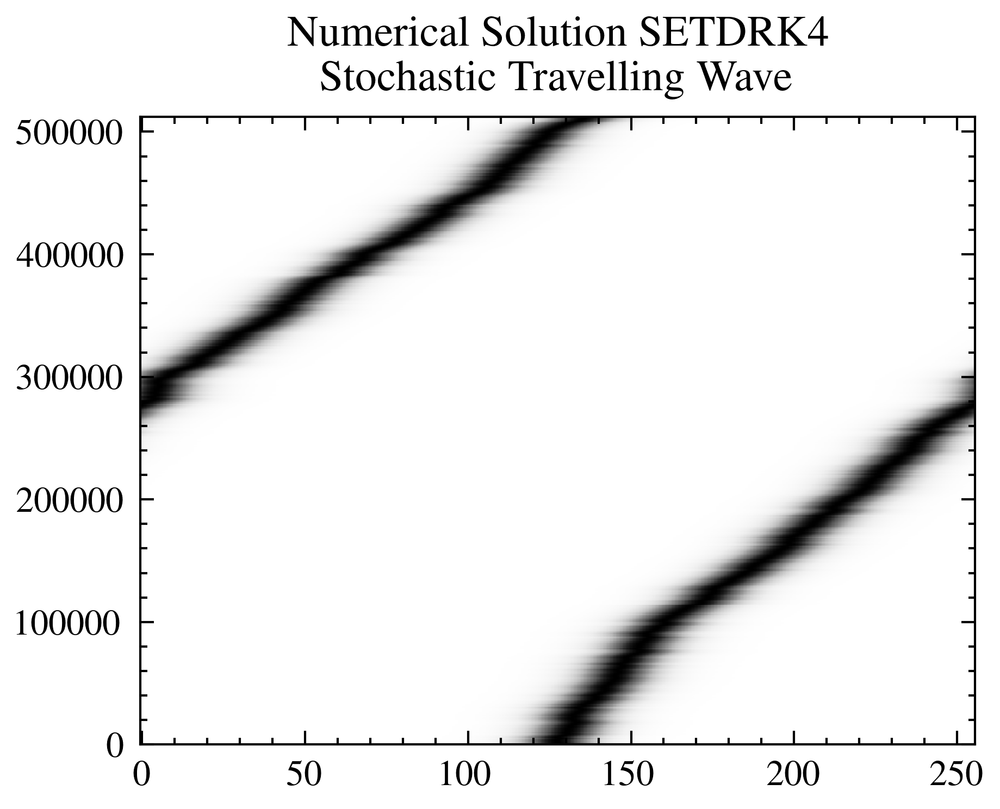

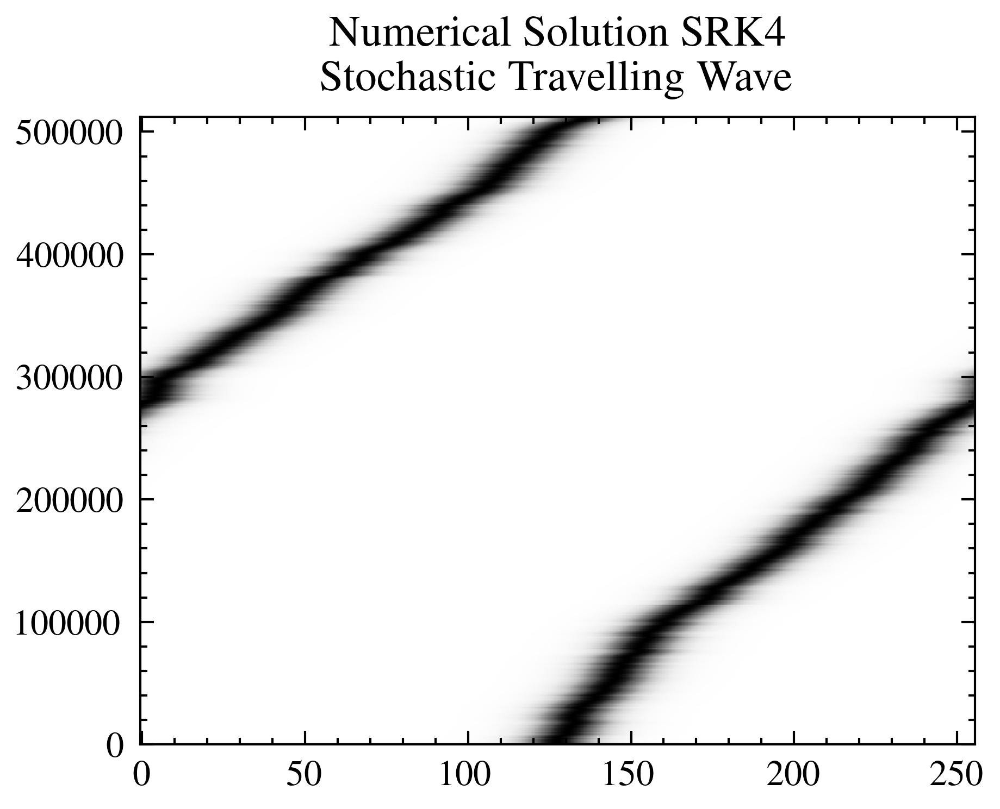

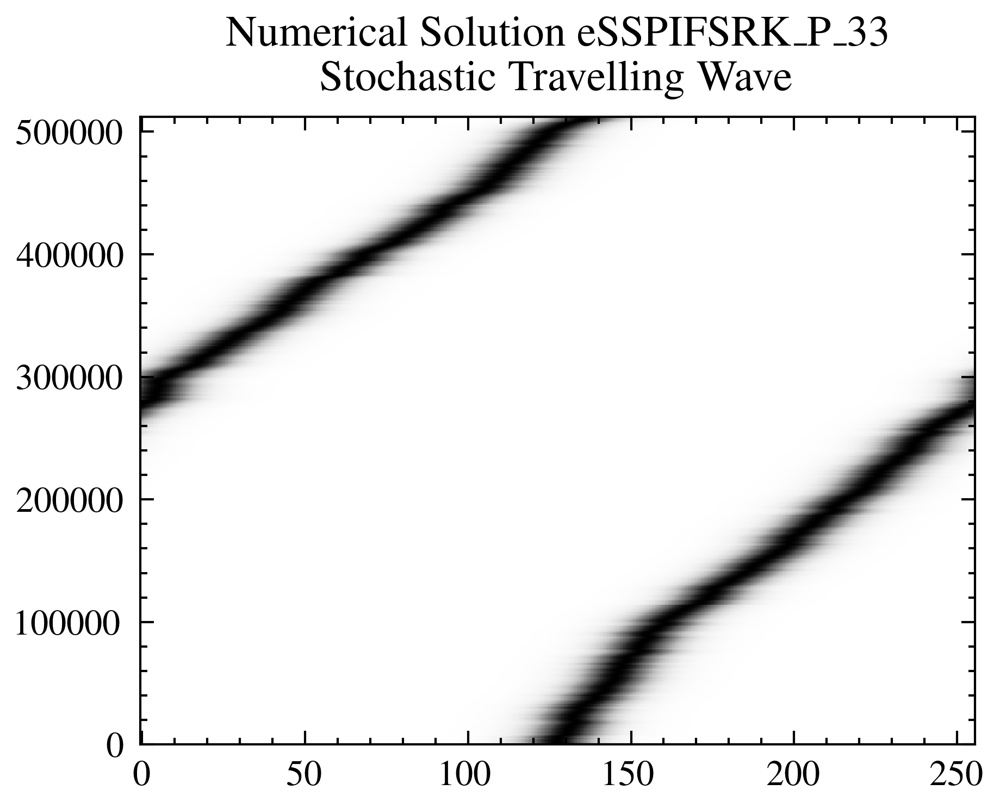

dt: 1.953125e-07 nt 512000 Tmax 0.1
array: [2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 6.66105492e-09
 1.60126722e-09 3.35451787e-10] [8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 5.84706259e-09
 1.41612908e-09 2.91967941e-10] [           nan            nan            nan            nan
            nan            nan            nan 3.71496129e-09
 9.26828962e-10 1.82724890e-10] [           nan 8.81062567e-03 2.63110328e-03 9.67156597e-04
 3.83289130e-04 1.72508643e-04 8.07749700e-05 3.86069017e-05
 1.90913824e-05 9.42398351e-06]


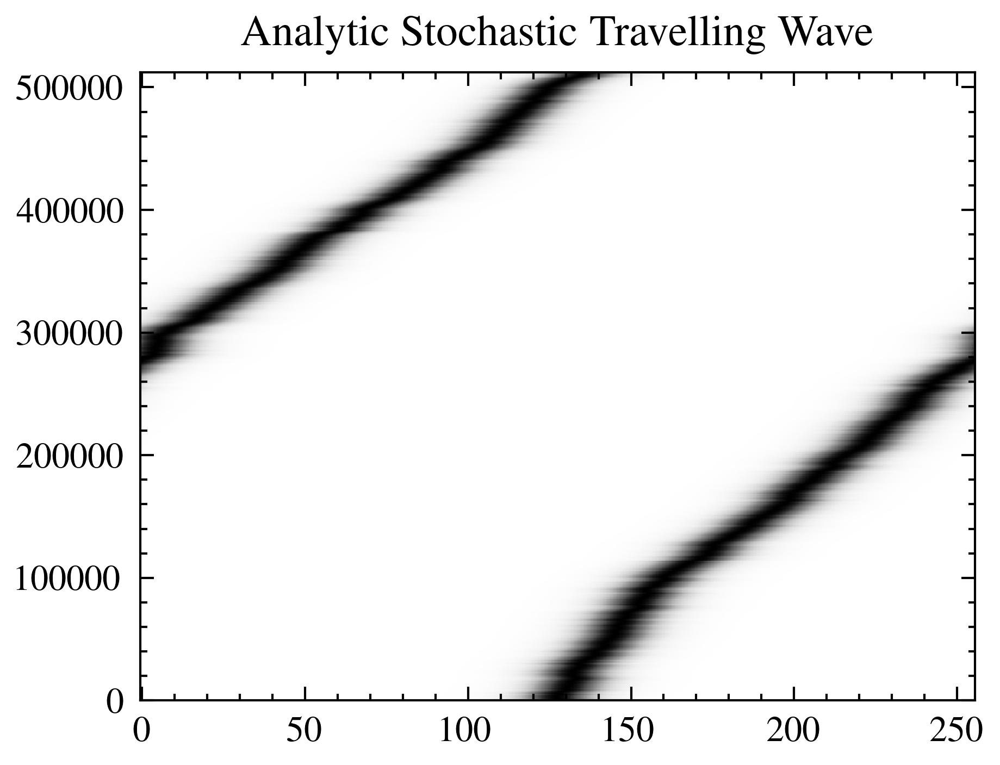

: 

In [ ]:
max_number = 10
array = jnp.zeros(max_number)
array2 = jnp.zeros(max_number)
array3 = jnp.zeros(max_number)
array4 = jnp.zeros(max_number)
for i in range(max_number):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_IFSRK4',dt= 1e-4*1/2**i,nt = int(1e3*2**i),tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    
    signal_params_2 = ConfigDict(KDV_params_exact_traveling)
    signal_params_2.update(E=1,method='Dealiased_SETDRK4',dt= 1e-4*1/2**i,nt = int(1e3*2**i),tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model_2 = ETD_KT_CM_JAX_Vectorised(signal_params_2)

    signal_params_3 = ConfigDict(KDV_params_exact_traveling)
    signal_params_3.update(E=1,method='Dealiased_SRK4',dt= 1e-4*1/2**i,tmax=0.1,nt = int(1e3*2**i),nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model_3 = ETD_KT_CM_JAX_Vectorised(signal_params_3)

    signal_params_4 = ConfigDict(KDV_params_exact_traveling)
    signal_params_4.update(E=1,method='Dealiased_eSSPIFSRK_P_33',dt= 1e-4*1/2**i,nt = int(1e3*2**i),tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='steep_traveling_wave')
    signal_model_4 = ETD_KT_CM_JAX_Vectorised(signal_params_4)

    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)

    dW = dW_refine[i] / jnp.sqrt(2**(max_number-i))# rescale to unit normal as required by integrator.
    nmax = signal_model.params.nt
    print(nmax)
    final, all = signal_model.run(initial_signal, signal_model.params.nt, dW, key) #the final input is scan length? 
    final2, all2 = signal_model_2.run(initial_signal, signal_model.params.nt, dW, key)
    final3, all3 = signal_model_3.run(initial_signal, signal_model.params.nt, dW, key)
    final4, all4 = signal_model_4.run(initial_signal, signal_model.params.nt, dW, key)
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)
    signal2 = jnp.concatenate([initial_signal[None,...], all2], axis=0)
    signal3 = jnp.concatenate([initial_signal[None,...], all3], axis=0)
    signal4 = jnp.concatenate([initial_signal[None,...], all4], axis=0)

    plt.imshow(signal[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SIFRK4\n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal2[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SETDRK4\n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal3[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SRK4\n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal4[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution eSSPIFSRK_P_33\n Stochastic Travelling Wave')
    plt.show()

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.params.nt+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.params.nt
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    tmax = signal_model.params.tmax
    print('dt:',dt,'nt',nmax,'Tmax',tmax)
    analytic = jnp.zeros([nmax+1, E, nx])


    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen    
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 8 * 8 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.params.nt + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)
        
    plt.imshow(analytic[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Analytic Stochastic Travelling Wave')
    if i==9:
        plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Analytic_Steep_Travelling_Wave.png',bbox_inches='tight',dpi=300)
    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array = array.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
    array2 = array2.at[i].set( relative_error(signal2[:,:,:], analytic[:,:,:]) )
    array3 = array3.at[i].set( relative_error(signal3[:,:,:], analytic[:,:,:]) )
    array4 = array4.at[i].set( relative_error(signal4[:,:,:], analytic[:,:,:]) )
    print('array:',array,array2,array3,array4)
    plt.show()

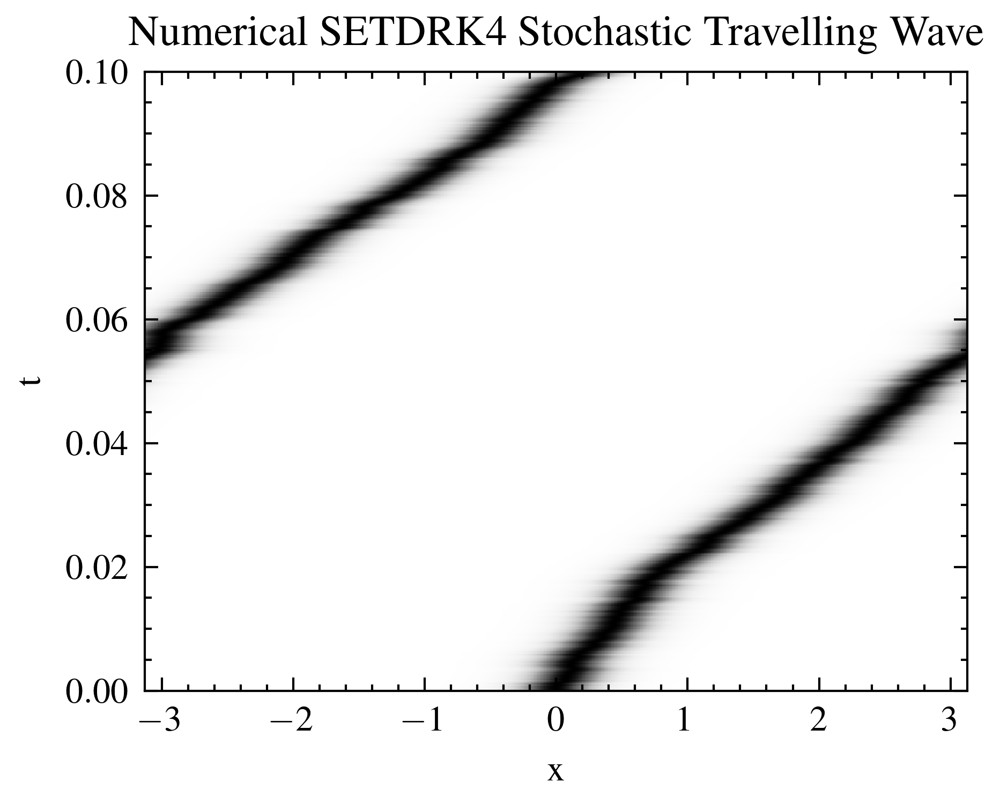

: 

In [ ]:
plt.imshow(signal2[:,0,:], aspect='auto', cmap='Grays', origin='lower',
           extent=[x[0], x[-1], 0, tmax])
plt.xlabel('x')
plt.ylabel('t')
plt.title('Numerical SETDRK4 Stochastic Travelling Wave')
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/EX5_main_SETDRK4_Steep_Travelling_Wave.png',bbox_inches='tight',dpi=300)

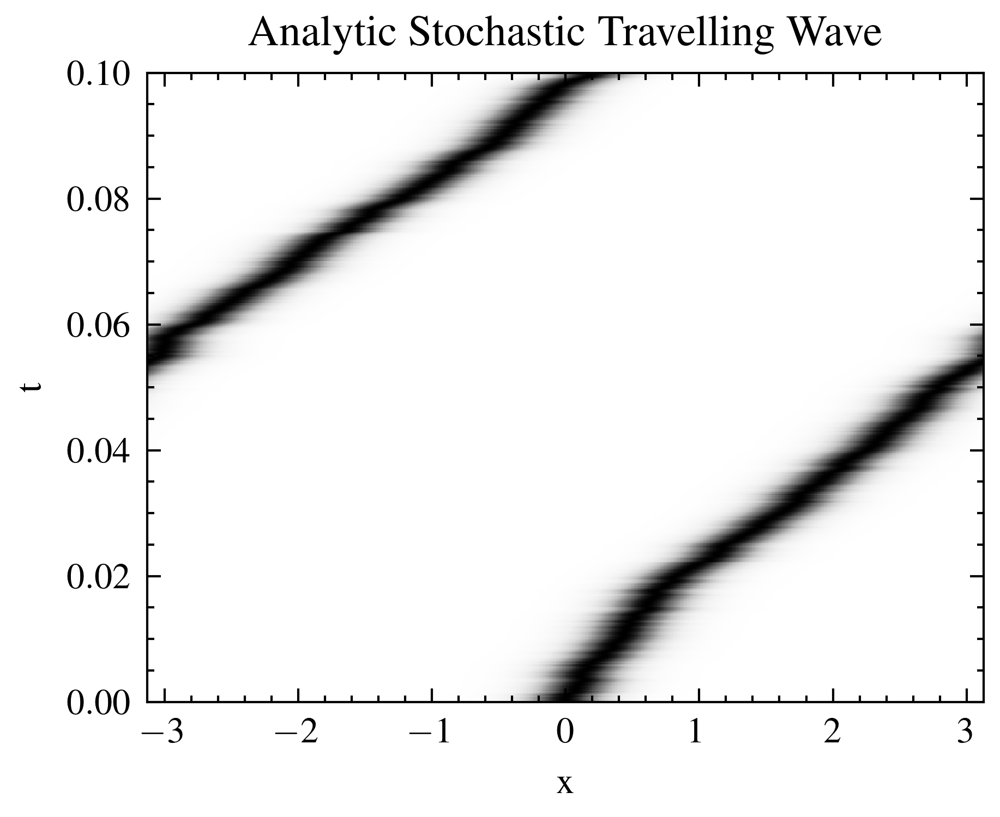

: 

In [ ]:
plt.imshow(signal[:,0,:], aspect='auto', cmap='Grays', origin='lower',
           extent=[x[0], x[-1], 0, tmax])
plt.xlabel('x')
plt.ylabel('t')
plt.title('Analytic Stochastic Travelling Wave')
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/EX5_main_Analytic_Steep_Travelling_Wave.png',bbox_inches='tight',dpi=300)

[2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 6.66105492e-09
 1.60126722e-09 3.35451787e-10]
[8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 5.84706259e-09
 1.41612908e-09 2.91967941e-10]
(10,)


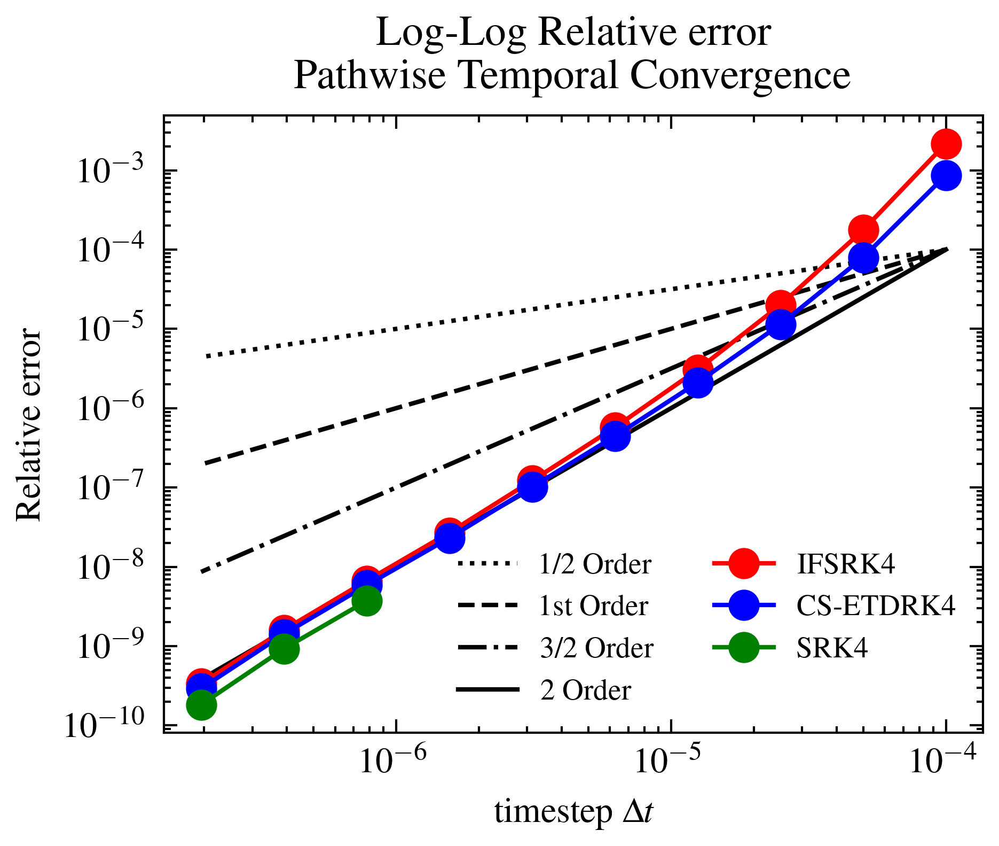

: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','ieee'])
dt = 1e-4*np.asarray([2**-i for i in range(0,max_number)])
values = array
print(values)
print(array2)
print(values.shape)
a = 1e-4
v = 0.0001
plt.figure()
#plt.scatter(a,0.1, color='r', label='point')

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')

plt.loglog(dt,values, marker='o', linestyle='-', color='r',label='IFSRK4')
plt.loglog(dt,array2, marker='o', linestyle='-', color='b',label='CS-ETDRK4')
plt.loglog(dt,array3, marker='o', linestyle='-', color='g',label='SRK4')
#plt.loglog(dt,array4, marker='o', linestyle='-', color='m',label='eSSPIFSRK_P_33')


plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('Log-Log Relative error \n Pathwise Temporal Convergence')
#plt.grid(True, which="both", ls="--")
plt.legend()
plt.legend(fontsize='small', loc='best', ncol=2)
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/EX5_main_Temporal_convergence_RK4_IFRK4_ETDRK4_eSSPIFSRK_P_33.png',bbox_inches='tight',dpi=300)
plt.show()

[2.17197892e-03 1.76264203e-04 1.99823177e-05 3.06094324e-06
 5.72152415e-07 1.22081841e-07 2.69707348e-08 6.66105492e-09
 1.60126722e-09 3.35451787e-10]
[8.68759424e-04 7.95195943e-05 1.13885258e-05 2.10969408e-06
 4.43359151e-07 1.01343742e-07 2.31342791e-08 5.84706259e-09
 1.41612908e-09 2.91967941e-10]
(10,)


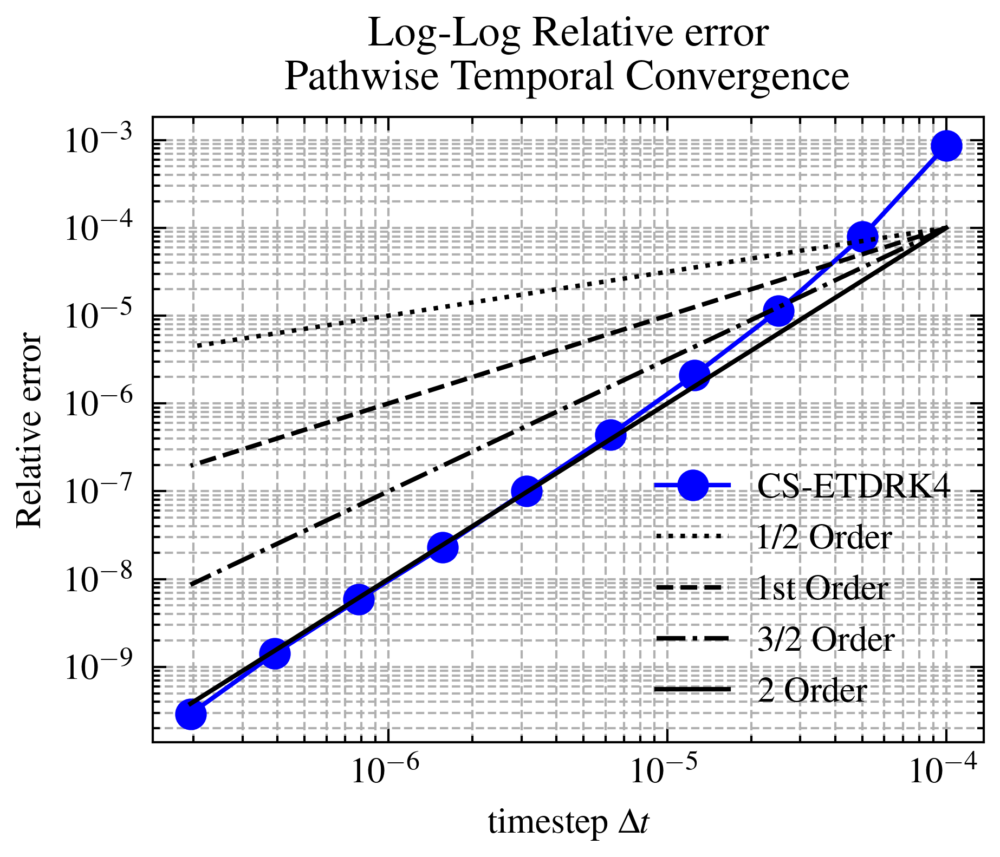

: 

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','ieee'])
dt = 1e-4*np.asarray([2**-i for i in range(0,max_number)])
values = array
print(values)
print(array2)
print(values.shape)
a = 1e-4
v = 0.0001
plt.figure()
#plt.scatter(a,0.1, color='r', label='point')
#plt.loglog(dt,values, marker='o', linestyle='-', color='r',label='IFSRK4')
plt.loglog(dt,array2, marker='o', linestyle='-', color='b',label='CS-ETDRK4')
#plt.loglog(dt,array3, marker='o', linestyle='-', color='g',label='SRK4')

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')

plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('Log-Log Relative error \n Pathwise Temporal Convergence')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Temporal_convergence_ETDRK4.png',bbox_inches='tight',dpi=300)
plt.show()